## <p style="background-color:yellow;color:black;font-size:120%;text-align:center;border-radius:10px 10px;font-weight:bold;border:0px solid #800080;">🇮🇳 SharkTank India Exploratory Data Analysis (EDA) 🦈</p>
## Dataset https://www.kaggle.com/datasets/thirumani/shark-tank-india

In [1]:
from IPython.display import IFrame
import datetime
print("Notebook was last executed on:", datetime.date.today().strftime("%Y-%b-%d"), "with Python version")
!python --version

Notebook was last executed on: 2024-May-05 with Python version
Python 3.10.13


In [2]:
# Source: Wikipedia
IFrame('https://upload.wikimedia.org/wikipedia/en/2/2f/Shark_Tank_India.jpg', width=310, height=330)

## ⚒️ Importing Required Python Libraries

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

import matplotlib.pyplot as plt
import seaborn as sns
from babel.numbers import format_currency
from wordcloud import WordCloud, STOPWORDS
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"
pio.renderers.default = 'notebook'

## ⏳ Check and import dataset

In [4]:
! ls -l /kaggle/input/d/thirumani/shark-tank-india/
shark_tank = pd.read_csv('/kaggle/input/d/thirumani/shark-tank-india//Shark Tank India.csv', encoding = "ISO-8859-1")

nRow, nCol = shark_tank.shape
print(f'\nThere are {nRow} rows and {nCol} columns in the dataset')

total 136
-rw-r--r-- 1 nobody nogroup 136967 May  4 05:23 'Shark Tank India.csv'

There are 478 rows and 78 columns in the dataset


## 💵 Exploratory Data Analysis (EDA)

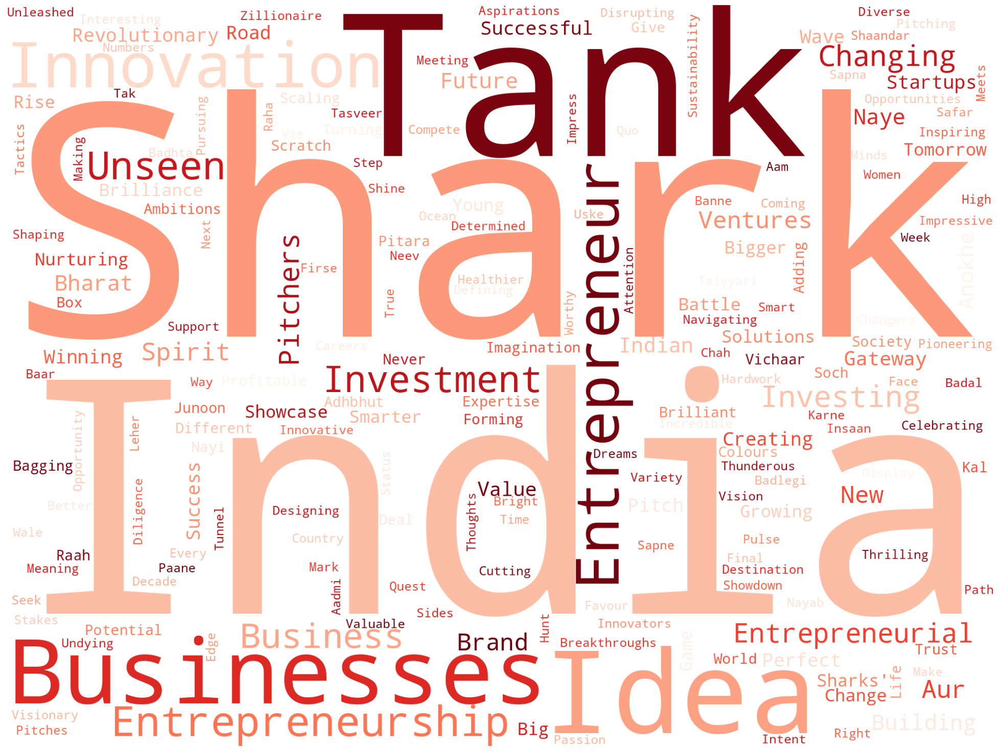

In [5]:
# Word cloud based on episode titles
text = " Shark Tank India ".join(cat for cat in shark_tank.loc[shark_tank['Episode Title'].notnull()]['Episode Title'])
stop_words = list(STOPWORDS) + ["Ka", "Ki", "Ke", "Ko", "Se", "Hai", "Ek"]
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='white', colormap='Reds', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [6]:
shark_tank.head(5)

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
0,1,BluePineFoods,1,1,20-Dec-21,4-Feb-22,20-Dec-21,Badlegi Business Ki Tasveer,Rannvijay Singh,Food,Frozen Momos,https://bluepinefoods.com/,2016.0,3,2.0,1.0,NaN,0.0,Middle,Delhi,Delhi,95.0,8.0,NaN,NaN,...,25.0,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,5.33,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
1,1,BoozScooters,1,2,20-Dec-21,4-Feb-22,20-Dec-21,Badlegi Business Ki Tasveer,Rannvijay Singh,Vehicles/Electrical Vehicles,Renting e-bike for mobility in private spaces,https://www.boozup.net/,2017.0,1,1.0,NaN,NaN,0.0,Young,Ahmedabad,Gujarat,4.0,0.4,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,25.00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
2,1,HeartUpMySleeves,1,3,20-Dec-21,4-Feb-22,20-Dec-21,Badlegi Business Ki Tasveer,Rannvijay Singh,Beauty/Fashion,Detachable Sleeves,https://heartupmysleeves.com/,2021.0,1,NaN,1.0,NaN,0.0,Young,Delhi,Delhi,NaN,2.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
3,1,TagzFoods,2,4,20-Dec-21,4-Feb-22,21-Dec-21,"Insaan, Ideas Aur Sapne",Rannvijay Singh,Food,Healthy Potato Chips Snacks,https://tagzfoods.com/,2019.0,2,2.0,NaN,NaN,0.0,Middle,Bangalore,Karnataka,700.0,NaN,48.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.0,2.75,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
4,1,HeadAndHeart,2,5,20-Dec-21,4-Feb-22,21-Dec-21,"Insaan, Ideas Aur Sapne",Rannvijay Singh,Education,Brain Development Course,https://thehnh.in/,2015.0,4,1.0,3.0,NaN,1.0,Middle,Patiala,Punjab,30.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN


In [7]:
shark_tank.tail(10).T

,468,469,470,471,472,473,474,475,476,477
Season Number,3,3,3,3,3,3,3,3,3,3
Startup Name,NeonAttack,PTal,RoadPilot,SmartMop,Lea,$KrishnaRama,Rentit4me,CoolTheGlobe,Canvaloop,DigitalPaani
Episode Number,50,50,50,51,51,51,51,52,52,52
Pitch Number,469,470,471,472,473,474,475,476,477,478
Season Start,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24
...,...,...,...,...,...,...,...,...,...,...
Aman Present,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Peyush Present,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Amit Present,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ashneer Present,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
shark_tank['Season Number'] = shark_tank['Season Number'].astype(pd.Int32Dtype())
shark_tank['Episode Number'] = shark_tank['Episode Number'].astype(pd.Int32Dtype())
shark_tank['Pitch Number'] = shark_tank['Pitch Number'].astype(pd.Int32Dtype())

shark_tank['Number of Presenters'] = shark_tank['Number of Presenters'].astype(pd.Int32Dtype())
shark_tank['Male Presenters'] = shark_tank['Male Presenters'].astype(pd.Int32Dtype())
shark_tank['Female Presenters'] = shark_tank['Female Presenters'].astype(pd.Int32Dtype())
shark_tank['Transgender Presenters'] = shark_tank['Transgender Presenters'].astype(pd.Int32Dtype())
shark_tank['Couple Presenters'] = shark_tank['Couple Presenters'].astype(pd.Int32Dtype())

shark_tank['Startup Name'] = shark_tank['Startup Name'].astype(str)
shark_tank['Industry'] = shark_tank['Industry'].astype(str)
shark_tank['Business Description'] = shark_tank['Business Description'].astype(str)

shark_tank['Gross Margin'] = shark_tank['Gross Margin'].astype(pd.Int32Dtype())
shark_tank['Net Margin'] = shark_tank['Net Margin'].astype(pd.Int32Dtype())

shark_tank['Started in'] = shark_tank['Started in'].astype(pd.Int32Dtype())
shark_tank['Yearly Revenue'] = shark_tank['Yearly Revenue'].astype(pd.Int32Dtype())

shark_tank['Received Offer'] = shark_tank['Received Offer'].astype(pd.Int32Dtype())
shark_tank['Accepted Offer'] = shark_tank['Accepted Offer'].astype(pd.Int32Dtype())

In [9]:
shark_tank.sample(10).style.set_properties(**{"background-color": "#2a9d8f","color":"white","border": "1px solid black", 'font-size': '10pt'})

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,EBITDA,Cash Burn,SKUs,Has Patents,Bootstrapped,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Total Deal Debt,Debt Interest,Deal Valuation,Number of Sharks in Deal,Deal Has Conditions,Royalty Deal,Advisory Shares Equity,Namita Investment Amount,Namita Investment Equity,Namita Debt Amount,Vineeta Investment Amount,Vineeta Investment Equity,Vineeta Debt Amount,Anupam Investment Amount,Anupam Investment Equity,Anupam Debt Amount,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
20,1,Kavach,7,21,20-Dec-21,4-Feb-22,28-Dec-21,A Never Give Up Spirit,Rannvijay Singh,Education,Report bullying incidents,https://antibullyingsquad.com/,2018,2,1,1,,0,Young,Gurgaon,Haryana,,nan,,,nan,nan,nan,nan,nan,5.000000,10.000000,50.000000,1,1,5.000000,10.000000,nan,nan,50.000000,2.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,2.500000,5.000000,nan,2.500000,5.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,nan,1.000000,nan
338,3,NabhiSutra,6,339,22-Jan-24,31-Mar-24,29-Jan-24,Nurturing The Spirit Of Entrepreneurship,Rahul Dua,Beauty/Fashion,Navel Ayurvedic Oils Online,https://nabhisutra.com/,,2,1,1,,0,Middle,Vadodara,Gujarat,450,50.000000,,8,nan,nan,nan,nan,nan,60.000000,3.000000,2000.000000,0,,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan,nan,nan
180,2,Freebowler,10,181,2-Jan-23,10-Mar-23,13-Jan-23,Zillionaire Banne Ki Chah,Rahul Dua,Sports,Non-Electric & Portable Bowling Machines,https://freebowler.com/,,2,2,,,0,Middle,Bangalore,Karnataka,,nan,,,nan,nan,nan,nan,nan,75.000000,7.500000,1000.000000,1,1,25.000000,7.500000,50.000000,10.000000,333.333333,1.000000,nan,nan,nan,25.000000,7.500000,50.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan,nan,nan
361,3,RajaRaniCoaching,14,362,22-Jan-24,31-Mar-24,8-Feb-24,Pitch Perfect,Rahul Dua,Beauty/Fashion,Clothes Tailoring Academy,https://www.rajaranicoaching.com/,2021,2,1,1,,1,Young,Surat,Gujarat,200,nan,,,nan,nan,nan,nan,nan,130.000000,5.000000,2600.000000,1,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,1.000000,nan,nan
76,1,TheSassBar,24,77,20-Dec-21,4-Feb-22,20-Jan-22,A Decade Of Indian Entrepreneurship,Rannvijay Singh,Beauty/Fashion,Gifts Soaps,https://www.thesassbar.com/,2019,1,,1,,0,Young,Mumbai,Maharashtra,,7.000000,65,55,nan,nan,nan,nan,nan,40.000000,8.000000,500.000000,1,1,50.000000,35.000000,nan,nan,143.000000,2.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,25.000000,17.500000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,25.000000,17.500000,nan,Ghazal Alagh,Ghazal Alagh,1.000000,1.000000,1.000000,nan,1.000000,nan,nan,1.000000
187,2,InsideFPV,13,188,2-Jan-23,10-Mar-23,18-Jan-23,Up And Coming Business Ideas,Rahul Dua,Manufacturing,Plug and Fly Drones,https://www.insidefpv.com/,,3,2,1,,0,Young,Surat,

In [10]:
shark_tank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478 entries, 0 to 477
Data columns (total 78 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Season Number              478 non-null    Int32  
 1   Startup Name               478 non-null    object 
 2   Episode Number             478 non-null    Int32  
 3   Pitch Number               478 non-null    Int32  
 4   Season Start               478 non-null    object 
 5   Season End                 478 non-null    object 
 6   Original Air Date          447 non-null    object 
 7   Episode Title              478 non-null    object 
 8   Anchor                     478 non-null    object 
 9   Industry                   478 non-null    object 
 10  Business Description       478 non-null    object 
 11  Company Website            466 non-null    object 
 12  Started in                 355 non-null    Int32  
 13  Number of Presenters       478 non-null    Int32  

In [11]:
shark_tank.describe().T.round(2).style.background_gradient(cmap = 'Oranges')

,count,mean,std,min,25%,50%,75%,max
Season Number,478.000000,2.010460,0.804791,1.000000,1.000000,2.000000,3.000000,3.000000
Episode Number,478.000000,23.182008,15.028357,0.000000,10.000000,23.000000,35.000000,52.000000
Pitch Number,478.000000,239.500000,138.130976,1.000000,120.250000,239.500000,358.750000,478.000000
Started in,355.000000,2018.904225,2.770274,1998.000000,2018.000000,2019.000000,2021.000000,2023.000000
Number of Presenters,478.000000,2.020921,0.821349,1.000000,1.000000,2.000000,2.000000,6.000000
Male Presenters,412.000000,1.679612,0.819039,1.000000,1.000000,1.000000,2.000000,6.000000
Female Presenters,226.000000,1.199115,0.421847,1.000000,1.000000,1.000000,1.000000,3.000000
Transgender Presenters,3.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Couple Presenters,473.000000,0.177590,0.382572,0.000000,0.000000,0.000000,0.000000,1.000000
Yearly Revenue,241.000000,557.033195,1501.919516,0.000000,72.000000,170.000000,460.000000,18700.000000


In [12]:
# Unique values in each column
for col in shark_tank.columns:
    print("Number of unique values in", col, "-", shark_tank[col].nunique())

Number of unique values in Season Number - 3
Number of unique values in Startup Name - 478
Number of unique values in Episode Number - 53
Number of unique values in Pitch Number - 478
Number of unique values in Season Start - 3
Number of unique values in Season End - 3
Number of unique values in Original Air Date - 137
Number of unique values in Episode Title - 138
Number of unique values in Anchor - 3
Number of unique values in Industry - 17
Number of unique values in Business Description - 475
Number of unique values in Company Website - 466
Number of unique values in Started in - 16
Number of unique values in Number of Presenters - 6
Number of unique values in Male Presenters - 6
Number of unique values in Female Presenters - 3
Number of unique values in Transgender Presenters - 1
Number of unique values in Couple Presenters - 2
Number of unique values in Pitchers Average Age - 3
Number of unique values in Pitchers City - 113
Number of unique values in Pitchers State - 47
Number of 

## 🏦 All seasons of SHARK TANK INDIA was broadcasted in SonyLiv OTT and Sony TV

In [13]:
shark_tank_season1 = shark_tank.loc[shark_tank['Season Number']==1]
shark_tank_season1_without_unseen = shark_tank.loc[(shark_tank['Season Number']==1) & (shark_tank['Episode Number']!=0)]
shark_tank_season2 = shark_tank.loc[shark_tank['Season Number']==2]
shark_tank_season3 = shark_tank.loc[(shark_tank['Season Number']==3) | (shark_tank['Season Number'].isnull())]

In [14]:
# Data set information
print(shark_tank['Season Number'].max(), "total seasons in Indian SharkTank \n")
print(shark_tank['Pitch Number'].max(), "#startups came for pitching \n")
print("In Season 1, in", shark_tank_season1['Episode Number'].max(), "episodes, there were", shark_tank_season1.loc[shark_tank_season1['Episode Number']!=0]['Startup Name'].count(), "(real) pitches and", shark_tank_season1.loc[shark_tank_season1['Episode Number']==0]['Startup Name'].count(),"unseen pitches\n")
print("In Season 2, in", shark_tank_season2['Episode Number'].max(), "episodes, there were", shark_tank_season2.loc[shark_tank_season2['Episode Number']!=0]['Startup Name'].count(), "(real) pitches and", shark_tank_season2.loc[shark_tank_season2['Episode Number']==0]['Startup Name'].count(),"unseen pitch\n")
print("In Season 3, in", shark_tank_season3['Episode Number'].max(), "episodes, there were", shark_tank_season3.loc[shark_tank_season3['Episode Number']!=0]['Startup Name'].count(), "(real) pitches\n")

3 total seasons in Indian SharkTank 

478 #startups came for pitching 

In Season 1, in 36 episodes, there were 122 (real) pitches and 30 unseen pitches

In Season 2, in 51 episodes, there were 168 (real) pitches and 1 unseen pitch

In Season 3, in 52 episodes, there were 157 (real) pitches



Season Number    1   2   3
Episode Number  36  51  52


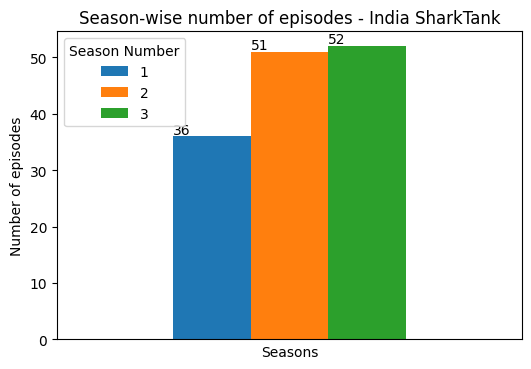

In [15]:
# Season-wise number of episodes
tmp = pd.pivot_table(shark_tank, values='Episode Number', columns='Season Number', aggfunc='max')
print(tmp)
ax = tmp.plot.bar(figsize=(6,4), title="Season-wise number of episodes - India SharkTank")
plt.xlabel("Seasons")
plt.ylabel("Number of episodes")
plt.xticks([])
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

In [16]:
# Season-wise number of pitches
tmp = shark_tank['Season Number'].value_counts().sort_values()
fig = px.bar(tmp, x=tmp.values, title="<b> SharkTank India - Season-wise number of pitches</b>", template='plotly_white', text=tmp, width=520, height=400)
fig.update_yaxes(tickvals=list(range(6)))
fig.update_xaxes(visible=False)
fig.show()

In [17]:
# There were 2 to 4 pitches, in each episode
print(shark_tank.loc[shark_tank['Episode Number']!=0][['Season Number','Episode Number']].value_counts().sort_values(ascending=True).unique())

[2 3 4]


In [18]:
# Types of industries, came for investment, in all seasons
tmp = shark_tank['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Shark Tank India - Industry wise startups (in all seasons)</b>", template='simple_white', text=tmp, width=820, height=650)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [19]:
# Types of industries, came for investment, in current/latest season (3rd season)
tmp = shark_tank_season3['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Indian Shark Tank in 3rd season - Industry wise startups</b>", template='simple_white', text=tmp, width=630, height=600)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [20]:
# All seasons averages
pivot = pd.pivot_table(shark_tank, values=['Original Ask Amount','Total Deal Amount','Valuation Requested','Deal Valuation','Original Offered Equity','Total Deal Equity'], columns='Season Number', aggfunc=np.mean, sort=False)
pivot.style.format('{:.0f}')

# Amount & Valuation is in INR in lakhs and equity in %

Season Number,1,2,3
Original Ask Amount,263,84,95
Total Deal Amount,57,66,73
Valuation Requested,4152,5991,5501
Deal Valuation,838,2407,3244
Original Offered Equity,5,3,3
Total Deal Equity,16,7,5


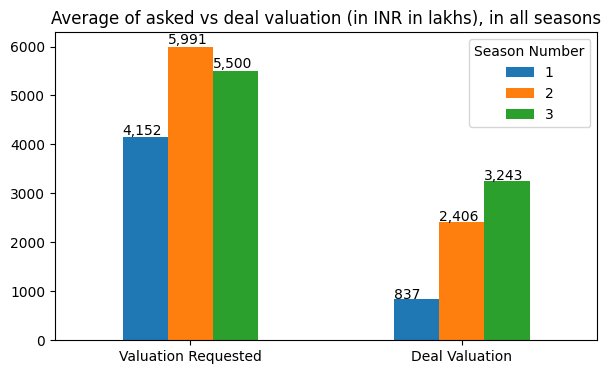

In [21]:
# All seasons average of offered/deal valuation
ax = pd.pivot_table(shark_tank, values=['Valuation Requested','Deal Valuation'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(7,4), title="Average of asked vs deal valuation (in INR in lakhs), in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

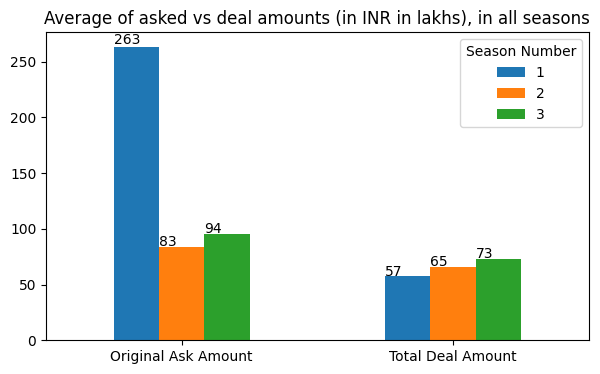

In [22]:
# All seasons average of offered/deal amounts
ax = pd.pivot_table(shark_tank, values=['Original Ask Amount','Total Deal Amount'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(7,4), title="Average of asked vs deal amounts (in INR in lakhs), in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

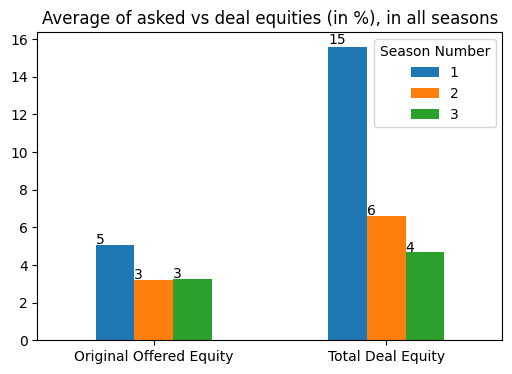

In [23]:
# All seasons average of offered/deal equities
ax = pd.pivot_table(shark_tank, values=['Original Offered Equity','Total Deal Equity'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(6,4), title="Average of asked vs deal equities (in %), in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

In [24]:
# Gender wise
print("Total pitchers -", int(shark_tank['Number of Presenters'].sum()), "\n")
print("")
print("Total male pitchers -", int(shark_tank['Male Presenters'].sum()), "\n")
print("Total female pitchers -", int(shark_tank['Female Presenters'].sum()), "\n")
print("Total transgender pitchers -", int(shark_tank['Transgender Presenters'].sum()), "\n")
print("")
print("COVID entrepreneurs/startups - ", shark_tank.loc[shark_tank['Started in']==2020]['Startup Name'].count(), sep='')

Total pitchers - 966 


Total male pitchers - 692 

Total female pitchers - 271 

Total transgender pitchers - 3 


COVID entrepreneurs/startups - 63


Male entrepreneurs percentage - 71.64%

Female entrepreneurs percentage - 28.05%

Transgender entrepreneurs percentage - 0.31%

Couple entrepreneurs percentage - 9.0%




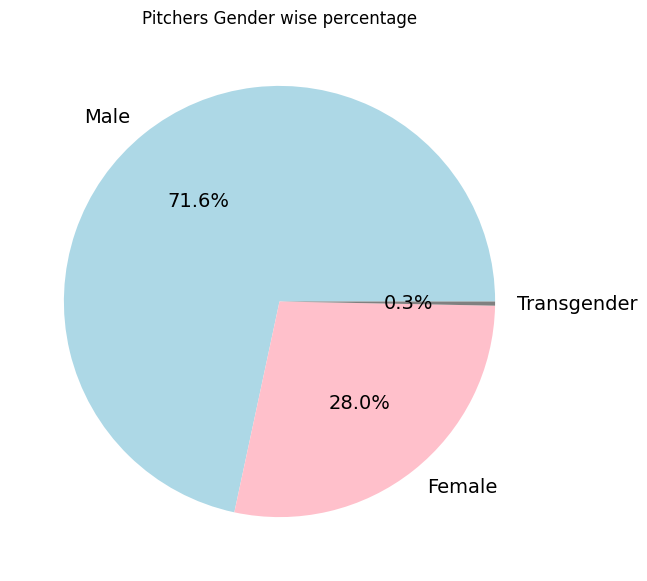

In [25]:
print("Male entrepreneurs percentage - ", round(shark_tank['Male Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), "%\n", sep='')
print("Female entrepreneurs percentage - ", round(shark_tank['Female Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), "%\n", sep='')
print("Transgender entrepreneurs percentage - ", round(shark_tank['Transgender Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), "%\n", sep='')
print("Couple entrepreneurs percentage - ", round(shark_tank.loc[shark_tank['Couple Presenters']==1]['Couple Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 0), "%\n", sep='')
print("")

fig = plt.figure(figsize =(10, 7))
plt.title("Pitchers Gender wise percentage")
plt.pie([round(shark_tank['Male Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), round(shark_tank['Female Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), round(shark_tank['Transgender Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2)], labels = ["Male","Female","Transgender"], autopct='%.1f%%', colors=["lightblue", "pink", "gray"], textprops={'fontsize': 14})
plt.show()

Pitchers Average Age
Middle    357
Young     118
Old         3
Name: count, dtype: int64 

Pitchers Average Age
Middle    75%
Young     25%
Old        1%
Name: proportion, dtype: object 



Text(0, 0.5, '')

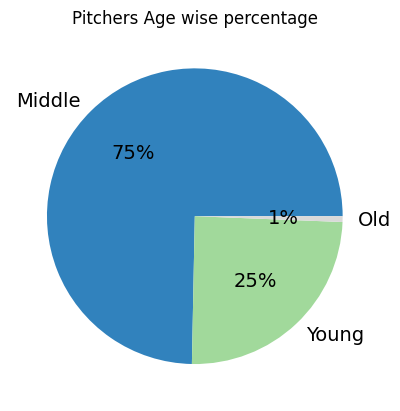

In [26]:
# Age wise
print(shark_tank['Pitchers Average Age'].value_counts(),"\n")

# In percentage
print(round(shark_tank['Pitchers Average Age'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

plt.title("Pitchers Age wise percentage")
shark_tank["Pitchers Average Age"].value_counts().plot(kind='pie', autopct='%.0f%%', cmap='tab20c', fontsize=14)
plt.ylabel('')

### 💹 67% companies received offers and 33% startups could not convince Sharks to invest

Received Offer
1    321
0    157
Name: count, dtype: Int64 

Received Offer
1    67%
0    33%
Name: proportion, dtype: object


Text(0, 0.5, '')

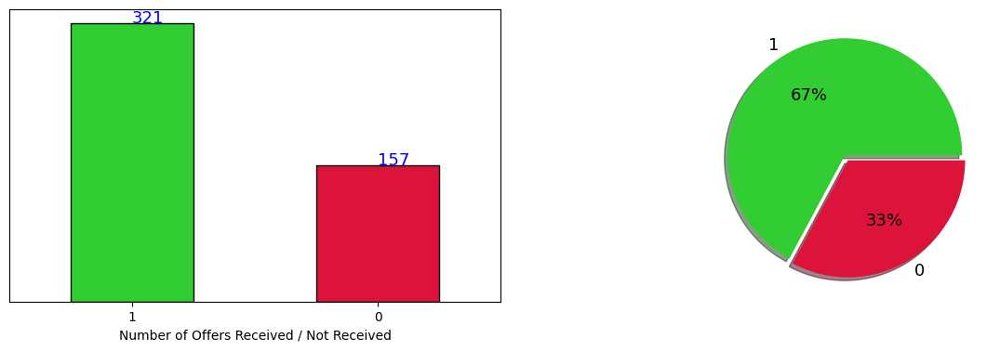

In [27]:
# Offers received
print(shark_tank['Received Offer'].value_counts(), "\n")
print(round(shark_tank['Received Offer'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
shark_tank["Received Offer"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Received / Not Received")
plt.yticks([])
plt.xticks(rotation=0)
for x,y in enumerate(shark_tank["Received Offer"].value_counts()):
    plt.annotate(y, (x,y), fontsize=13, color="blue")

ax2 = plt.subplot(222)
shark_tank["Received Offer"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=13)
plt.ylabel('')

# 321 companies received offers & 157 startups could not convince #Sharks to invest.

### ＄ 83% companies accepted offers and 17% startups didn't accept Sharks offer

Accepted Offer
1    268
0     53
Name: count, dtype: Int64 

Accepted Offer
1    83%
0    17%
Name: proportion, dtype: object


Text(0, 0.5, '')

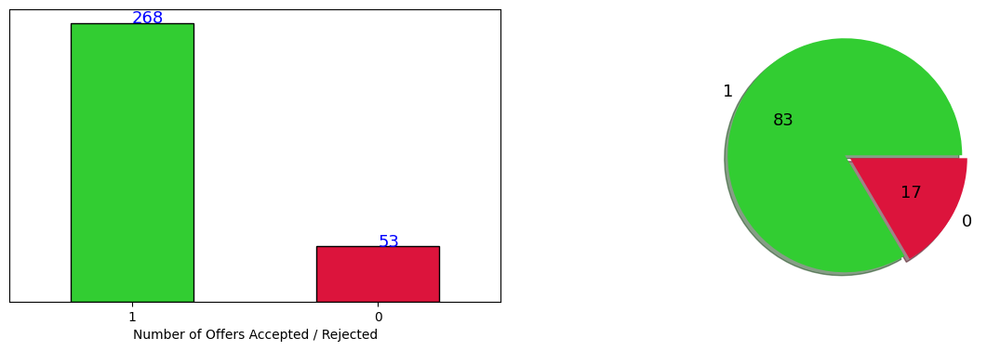

In [28]:
# Offers accepted
print(shark_tank['Accepted Offer'].value_counts(), "\n")
print(round(shark_tank['Accepted Offer'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15, 9))
ax1 = plt.subplot(221)
shark_tank["Accepted Offer"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Accepted / Rejected")
plt.yticks([])
plt.xticks(rotation = 0)
for x,y in enumerate(shark_tank["Accepted Offer"].value_counts()):
    plt.annotate(y, (x,y), fontsize=13, color="blue")
    
ax2 = plt.subplot(222)
shark_tank["Accepted Offer"].value_counts().plot(kind='pie', autopct='%.0f', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=13)
plt.ylabel('')

# 268 companies accepted investments they got & 53 #Startups did not accept Shark's offer.

In [29]:
# Offers rejected by pitchers/startup companies
print(shark_tank[shark_tank['Accepted Offer']==0]["Startup Name"].count())
shark_tank.loc[shark_tank['Accepted Offer']==0, ["Season Number","Startup Name","Industry","Original Ask Amount","Original Offered Equity"]]

53


,Season Number,Startup Name,Industry,Original Ask Amount,Original Offered Equity
6,1,qZenseLabs,Food,100.0,0.25
19,1,Torch-it,Education,75.0,1.00
21,1,LaKheerDeli,Food,50.0,7.50
27,1,KabiraHandmad,Food,100.0,5.00
41,1,MorrikoPureFoods,Food,100.0,3.00
55,1,IndiaHempandCo,Food,50.0,4.00
60,1,KetoIndia,Food,150.0,1.25
70,1,Moonshine,Food,80.0,0.50
71,1,Falhari,Food,50.0,2.00
73,1,UrbanMonkey,Beauty/Fashion,100.0,1.00


In [30]:
IFrame('https://public.tableau.com/views/SharkTankIndia_16448181343920/SharkTankIndiaStory', width=1100, height=1000)

In [31]:
# Maximum amount requested
print("Maximum amount requested, by a pitcher - Rs.", round(shark_tank["Original Ask Amount"].max()/100), "crores")

Maximum amount requested, by a pitcher - Rs. 300 crores


In [32]:
# Least amount requested
print("Least amount requested, by a pitcher - Rs.", round(shark_tank["Original Ask Amount"].min()*100000))

Least amount requested, by a pitcher - Rs. 0


In [33]:
# Sum of investment amount asked, in Shark Tank India
print("Sum of investment amount asked, by all startup companies, in Indian Shark Tank -", format_currency(shark_tank['Original Ask Amount'].sum()/100, 'INR', locale='en_IN').replace(".00", ""), "crores")

Sum of investment amount asked, by all startup companies, in Indian Shark Tank - ₹690.48 crores


In [34]:
# Amount invested by all sharks, in India SharkTank
print("Amount invested by all sharks, in Shark Tank India -", format_currency(shark_tank['Total Deal Amount'].sum()/100, 'INR', locale='en_IN').replace(".00", ""), "crores")

Amount invested by all sharks, in Shark Tank India - ₹177.36 crores


In [35]:
# Sum of loan/debt amount, in Indian Shark Tank
print("Sum of loan/debt amount, given by all sharks, in India SharkTank -", format_currency(shark_tank['Total Deal Debt'].sum()/100, 'INR', locale='en_IN').replace(".00", ""), "crores")

Sum of loan/debt amount, given by all sharks, in India SharkTank - ₹28.66 crores


In [36]:
# Top 20 investments (more than 1Cr), as per total investment/deal amount (in lakhs)
print(shark_tank.groupby('Startup Name')['Total Deal Amount'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Amount', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Amount', color="Startup Name", title="Highest Investment as per deal amount (in lakhs)", text=tmpdf['Total Deal Amount'])
fig.show()

Startup Name
NasherMiles     300.0
WeHear          250.0
Canvaloop       200.0
DilFoods        200.0
GoenchiFeni     200.0
JewelBox        200.0
MeduLance       200.0
Pharmallama     200.0
Refit           200.0
UnStop          200.0
AasVidyalaya    150.0
Intervue        150.0
Portl           150.0
Snitch          150.0
Stage           150.0
Trunome         150.0
YesMadam        150.0
TURMS           120.0
WiseLife        120.0
MindPeers       106.0
Name: Total Deal Amount, dtype: float64


In [37]:
# Top 20 investments, as per total equity/shares percentage diluted
print(shark_tank.groupby('Startup Name')['Total Deal Equity'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Equity', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Highest Investment as per Equity percentage", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name
Sid07Designs          75.00
BoozScooters          50.00
IsakFragrances        50.00
HammerLifestyle       40.00
KGAgrotech            40.00
TheSassBar            35.00
VivalyfInnovations    33.33
GoldSafeSolutions     30.00
HeartUpMySleeves      30.00
JainShikanji          30.00
ColourMeMad-CMM       25.00
CosIQ                 25.00
FindYourKicksIndia    25.00
HoloKitab             25.00
PNTRobotics           25.00
PolishMePretty        25.00
Raasa                 25.00
LOKA                  24.00
TheQuirkyNaari        24.00
WakaoFoods            21.00
Name: Total Deal Equity, dtype: float64


In [38]:
# Startups who sold more than 1/3rd of their company (equity) to Sharks
print(shark_tank.loc[shark_tank['Total Deal Equity'] > 32 ][["Startup Name"]].count())
print(shark_tank.loc[shark_tank['Total Deal Equity'] > 32 ][["Season Number","Startup Name","Total Deal Amount", "Total Deal Equity"]])

tmpdf = shark_tank.loc[shark_tank['Total Deal Equity'] > 32 ].sort_values('Total Deal Equity', ascending=False)
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Startups who sold more than 1/3rd of their company", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name    7
dtype: int64
    Season Number        Startup Name  Total Deal Amount  Total Deal Equity
1               1        BoozScooters               40.0              50.00
23              1  VivalyfInnovations               56.0              33.33
43              1     HammerLifestyle              100.0              40.00
66              1        Sid07Designs               25.0              75.00
76              1          TheSassBar               50.0              35.00
77              1          KGAgrotech               10.0              40.00
82              1      IsakFragrances               50.0              50.00


In [39]:
# Startups who got Debt/loan amount
print("Number of startups who got debt/loan amount", shark_tank['Total Deal Debt'].count(),"\n")
shark_tank.loc[shark_tank['Total Deal Debt'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity","Total Deal Debt"]]

Number of startups who got debt/loan amount 62 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Total Deal Debt
8,1,NOCD,20.0,15.00,30.0
44,1,PNTRobotics,25.0,25.00,25.0
46,1,BambooIndia,50.0,3.50,30.0
56,1,Otua,1.0,1.00,99.0
62,1,TheStatePlate,40.0,3.00,25.0
...,...,...,...,...,...
447,3,Nemocare,20.0,0.67,80.0
448,3,WhySoBlue,40.0,3.00,35.0
455,3,Prorata,50.0,10.00,50.0
458,3,Rocca,30.0,2.50,30.0


In [40]:
# Top 20 investments, as per total debt/loan amount
print(shark_tank.groupby('Startup Name')['Total Deal Debt'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Debt', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Debt', color="Startup Name", title="Highest Investment as per Debt amount (in lakhs)", text=tmpdf['Total Deal Debt'])
fig.show()

Startup Name
Stage                150.0
Deeva                125.0
WatchoutWearables    100.0
uBreathe             100.0
Otua                  99.0
Nemocare              80.0
Vecros                80.0
Katidhan              75.0
Wol3D                 70.0
TAC                   69.0
maisha                65.0
Hood                  60.0
iMumz                 60.0
AyuSynk               50.0
DailyDump             50.0
FlexifyMe             50.0
Freebowler            50.0
GROWiT                50.0
LilGoodness           50.0
NamhyaFoods           50.0
Name: Total Deal Debt, dtype: float64


In [41]:
# Startups who gave Royalty
print("Number of startups who gave Royalty", shark_tank['Royalty Deal'].count(),"\n")

shark_tank.loc[shark_tank['Royalty Deal'] == 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who gave Royalty 17 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
321,3,HonestHome,100.0,3.00
322,3,AdilQadri,100.0,1.00
342,3,Tiggle,50.0,20.00
351,3,GudGum,80.0,10.00
362,3,DecodeAge,100.0,2.25
375,3,YesMadam,150.0,2.00
378,3,PushSports,80.0,4.00
384,3,D'chica,80.0,2.00
385,3,Refit,200.0,1.00
387,3,Artinci,50.0,5.00


Season Number  1  2   3
Royalty Deal   0  0  17


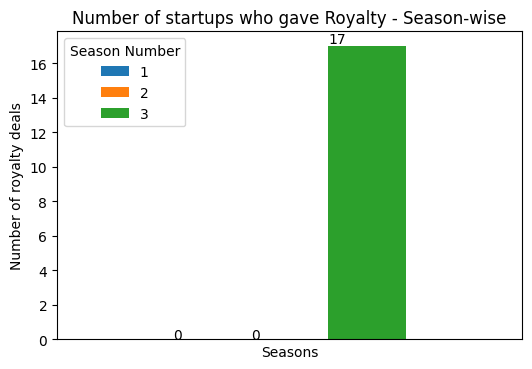

In [42]:
# Season-wise number of royalty deals
tmp = pd.pivot_table(shark_tank, values='Royalty Deal', columns='Season Number', aggfunc='count')
print(tmp)
ax = tmp.plot.bar(figsize=(6,4), title="Number of startups who gave Royalty - Season-wise")
plt.xlabel("Seasons")
plt.ylabel("Number of royalty deals")
plt.xticks([])
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

In [43]:
# Startups who gave Advisory shares
print("Number of startups who gave Advisory shares/equity", shark_tank['Advisory Shares Equity'].count(),"\n")

shark_tank.loc[shark_tank['Advisory Shares Equity'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity", "Advisory Shares Equity"]]

# DATA INCOMPLETE

Number of startups who gave Advisory shares/equity 3 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Advisory Shares Equity
334,3,AIKavach/Panoplia,100.0,2.50,2.5
341,3,WeHear,250.0,1.00,1.5
349,3,Arata,100.0,1.33,0.6


In [44]:
# Deals with conditions
print("Number of startups who accepted conditional deals", shark_tank['Deal Has Conditions'].count(),"\n")

shark_tank.loc[shark_tank['Deal Has Conditions'] == 'yes'][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who accepted conditional deals 26 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
8,1,NOCD,20.0,15.00
29,1,Meatyour,30.0,20.00
32,1,ARRCOATSurfaceTextures,50.0,15.00
44,1,PNTRobotics,25.0,25.00
79,1,PawsIndia,50.0,15.00
82,1,IsakFragrances,50.0,50.00
105,1,GrowFitter,50.0,2.00
224,2,Amore,75.0,7.50
238,2,CloudWorx,40.0,3.20
242,2,Daryaganj,90.0,1.00


In [45]:
# Gender-wise pitchers combination
shark_tank.groupby([shark_tank['Male Presenters'].fillna(0),shark_tank['Female Presenters'].fillna(0)]).size().nlargest(10)

# 2 males is most frequent combination followed by 1 male and 1 female

Male Presenters  Female Presenters
2                0                    109
1                1                    108
                 0                     88
3                0                     44
0                1                     37
2                1                     34
0                2                     29
1                2                      9
4                0                      9
3                1                      4
dtype: int64

In [46]:
# Gender/age wise pitchers combination
shark_tank.groupby([shark_tank['Male Presenters'],shark_tank['Pitchers Average Age']]).size().nlargest(10)

# Single male or two males in middle age is most frequent combination

Male Presenters  Pitchers Average Age
1                Middle                  157
2                Middle                  108
1                Young                    48
3                Middle                   42
2                Young                    36
3                Young                     8
4                Middle                    5
                 Young                     4
1                Old                       2
5                Young                     1
dtype: int64

In [47]:
# Gender/age wise pitchers combination
shark_tank.groupby([shark_tank['Female Presenters'],shark_tank['Pitchers Average Age']]).size().nlargest(10)

# Single female in middle age is frequent combination

Female Presenters  Pitchers Average Age
1                  Middle                  142
                   Young                    41
2                  Middle                   30
                   Young                     9
                   Old                       2
3                  Middle                    2
dtype: int64

## 💰 Which shark invested most ?

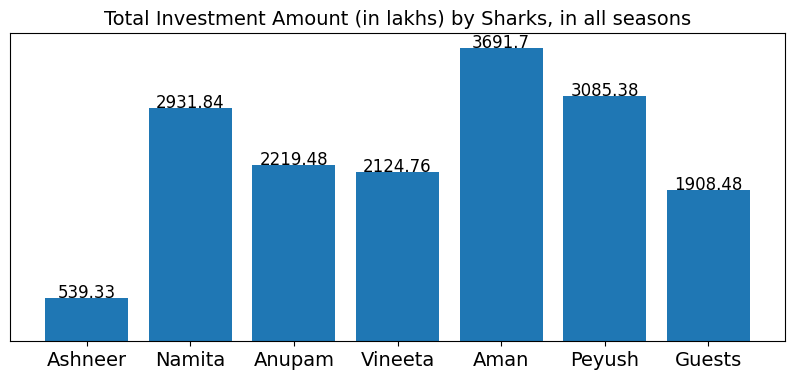

In [48]:
# Amount Invested by sharks, in all seasons
Amount = [shark_tank['Ashneer Investment Amount'].sum(), shark_tank['Namita Investment Amount'].sum(), shark_tank['Anupam Investment Amount'].sum(), shark_tank['Vineeta Investment Amount'].sum(),
    shark_tank['Aman Investment Amount'].sum(), shark_tank['Peyush Investment Amount'].sum(), shark_tank['Guest Investment Amount'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush', 'Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Investment Amount (in lakhs) by Sharks, in all seasons", fontsize=14)
plt.show()

# Aman invested maximum amount, in all seasons - 36 crores
# Ashneer invested minimum amount, in all seasons - 5 crores

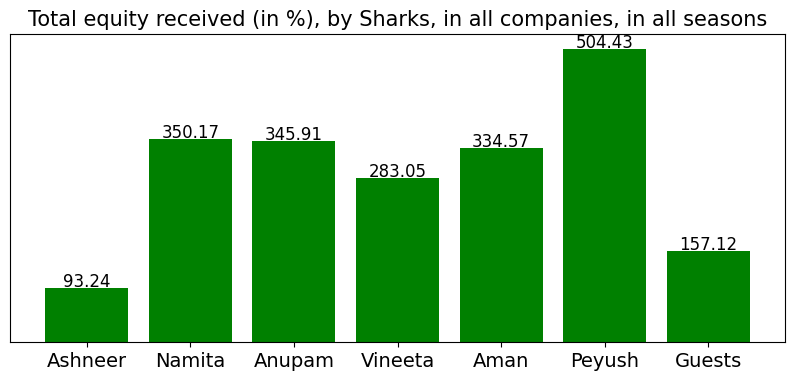

In [49]:
# Equity received by sharks, in all seasons
Amount = [shark_tank['Ashneer Investment Equity'].sum(), shark_tank['Namita Investment Equity'].sum(), shark_tank['Anupam Investment Equity'].sum(), shark_tank['Vineeta Investment Equity'].sum(),
    shark_tank['Aman Investment Equity'].sum(), shark_tank['Peyush Investment Equity'].sum(), shark_tank['Guest Investment Equity'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush', 'Guests']
df = {'Name':name, 'Total Equity':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total equity received (in %), by Sharks, in all companies, in all seasons", fontsize=15)
plt.show()

# Peyush got maximum equity of - 504% in different companies, in all seasons
# Ashneer got minimum equity of - 93% in different companies, in all seasons

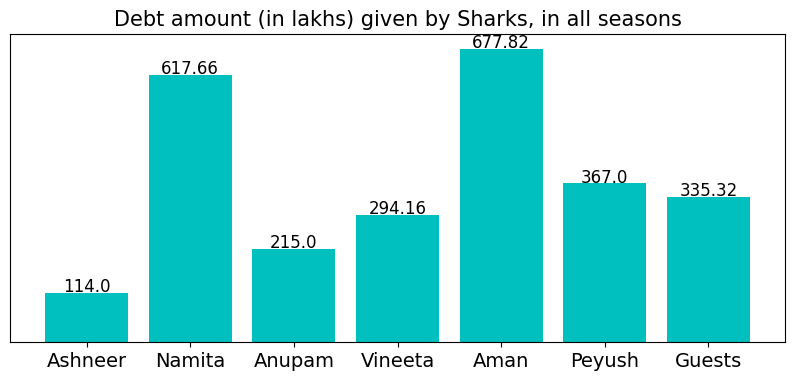

In [50]:
# Investment based on the Debt/loaned Amount, in all seasons
Amount = [shark_tank['Ashneer Debt Amount'].sum(), shark_tank['Namita Debt Amount'].sum(), shark_tank['Anupam Debt Amount'].sum(), shark_tank['Vineeta Debt Amount'].sum(),
    shark_tank['Aman Debt Amount'].sum(), shark_tank['Peyush Debt Amount'].sum(), shark_tank['Guest Debt Amount'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush', 'Guests']
df = {'Name':name, 'Total Equity':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='c')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Debt amount (in lakhs) given by Sharks, in all seasons", fontsize=15)
plt.show()

# Aman gave maximum debt amount, in all seasons - 6.7cr
# Ashneer gave minimum debt amount, in all seasons - 1.14cr

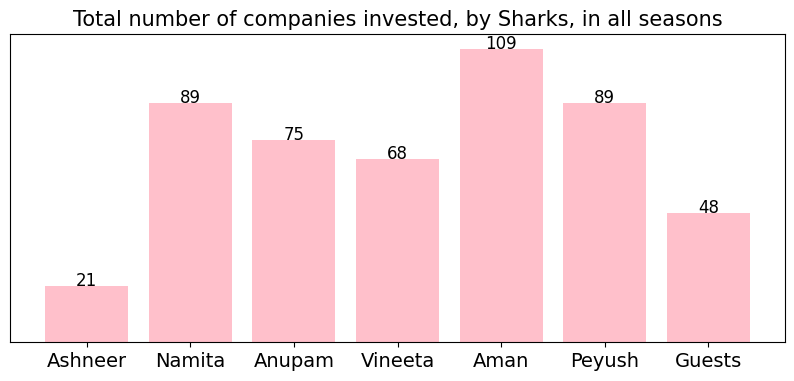

In [51]:
# Number of companies invested, in all seasons
Amount = [shark_tank['Ashneer Investment Amount'].count(), shark_tank['Namita Investment Amount'].count(), shark_tank['Anupam Investment Amount'].count(), shark_tank['Vineeta Investment Amount'].count(),
    shark_tank['Aman Investment Amount'].count(), shark_tank['Peyush Investment Amount'].count(), shark_tank['Guest Investment Amount'].count()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total number of companies invested, by Sharks, in all seasons", fontsize=15)
plt.show()

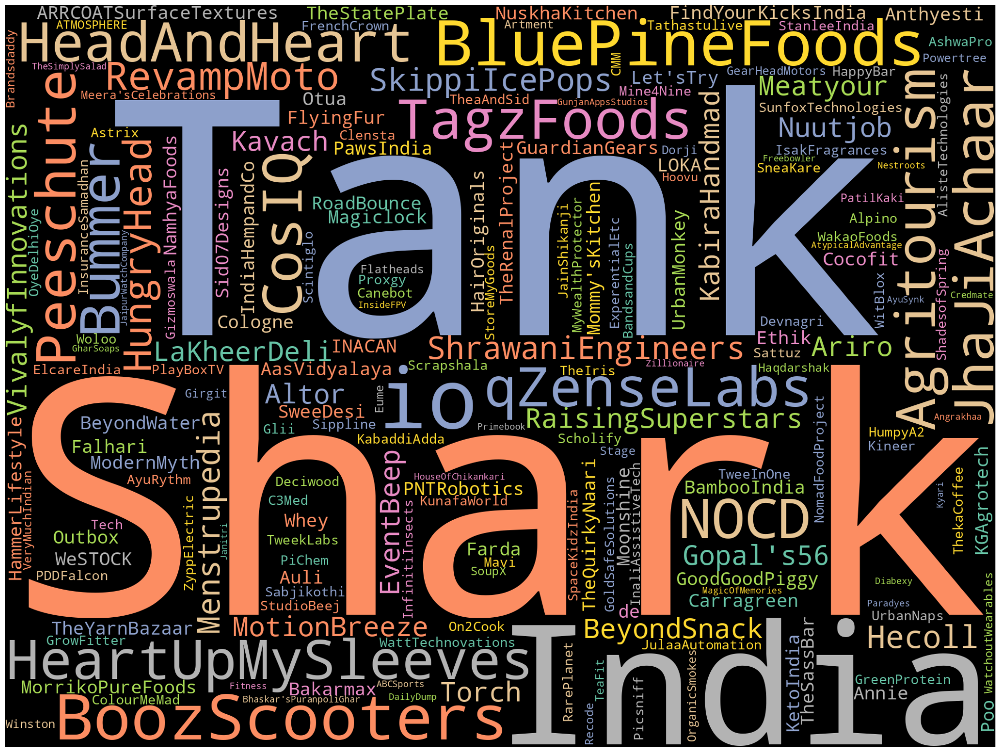

In [52]:
# Word cloud based on Startup Names, in all seasons
text = " Shark Tank India ".join(cat for cat in shark_tank['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='black', colormap='Set2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

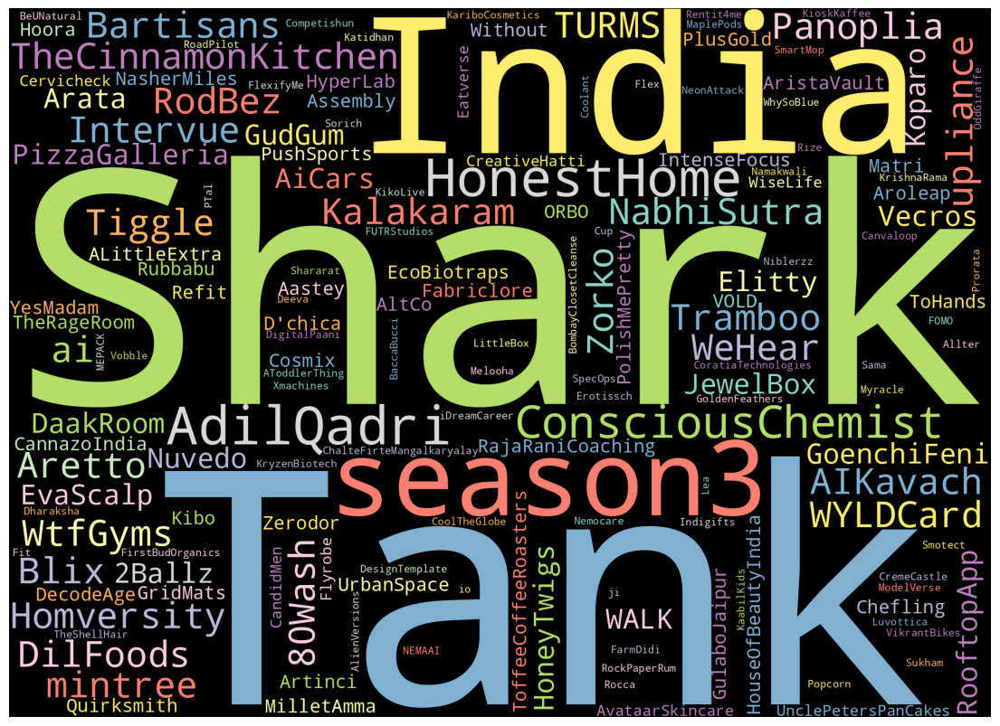

In [53]:
# Word cloud based on Startup Names, in current/latest season (3rd season)
text = " Shark Tank India season3 ".join(cat for cat in shark_tank_season3['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=1800, height=1300, stopwords=stop_words, background_color='black', colormap='Set3', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(14,14))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## 🔥 Ashneer Grover's Investments

Total investments by Ashneer 21
Investment amount by Ashneer 5.39 crores
Equity received by Ashneer 93.24 % in different companies
Debt/loan amount by Ashneer 1.14 crores

Company details:
---------------------------------------------------------------------------
      Startup Name                     Industry  Ashneer Investment Amount
     BluePineFoods                         Food                      25.00
      BoozScooters Vehicles/Electrical Vehicles                      20.00
         TagzFoods                         Food                      70.00
     SkippiIcePops                         Food                      20.00
 RaisingSuperstars                    Education                      50.00
       BeyondSnack                         Food                      25.00
      MotionBreeze Vehicles/Electrical Vehicles                      30.00
         EventBeep                    Education                      10.00
     TheYarnBazaar                Manufacturing             

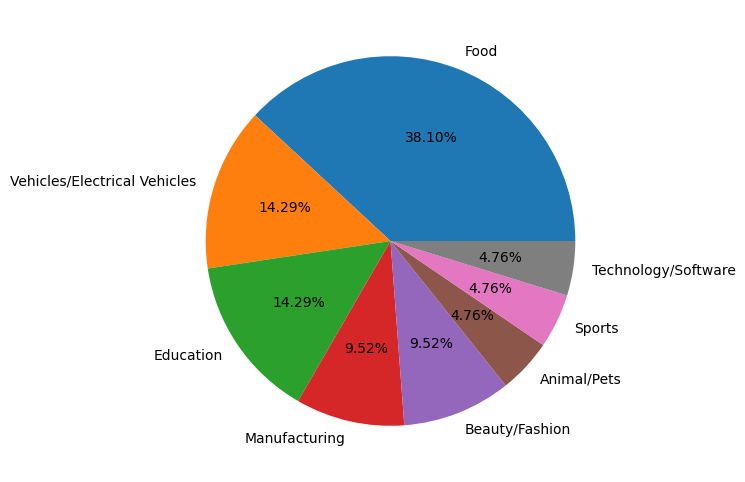

In [54]:
print("Total investments by Ashneer", shark_tank[shark_tank['Ashneer Investment Amount']>=0][['Ashneer Investment Amount']].count().to_string()[-2:])
print("Investment amount by Ashneer", round(shark_tank['Ashneer Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Ashneer", round(shark_tank['Ashneer Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Ashneer", round(shark_tank['Ashneer Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Ashneer Investment Amount']>=0][["Startup Name","Industry","Ashneer Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAshneer industry wise investments\n")
print(shark_tank[shark_tank['Ashneer Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Ashneer Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Ashneer Investment Amount']>=0] [["Startup Name","Ashneer Investment Amount","Ashneer Investment Equity"]].sort_values(by="Ashneer Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Ashneer Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 Namita Thapar's Investments

Total investments by Namita 89
Investment amount by Namita 29.32 crores
Equity received by Namita 350.17 % in different companies
Debt/loan amount by Namita 6.18 crores

Company details:
---------------------------------------------------------------------------
       Startup Name             Industry  Namita Investment Amount
        JhaJiAchaar                 Food                 28.300000
             Bummer       Beauty/Fashion                 37.500000
      SkippiIcePops                 Food                 20.000000
       Menstrupedia            Education                 50.000000
              Altor        Manufacturing                 25.000000
            Nuutjob       Beauty/Fashion                  8.330000
              Farda       Beauty/Fashion                 15.000000
               Auli       Beauty/Fashion                 75.000000
              Annie            Education                 35.000000
    TheRenalProject       Medical/Health                 50.000000


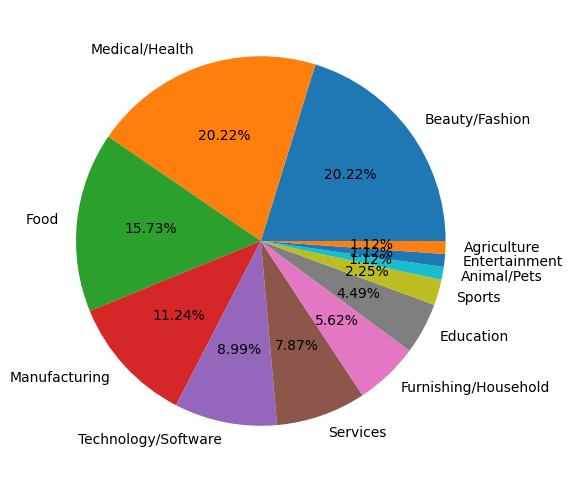

In [55]:
print("Total investments by Namita", shark_tank[shark_tank['Namita Investment Amount']>0][['Namita Investment Amount']].count().to_string()[-2:])
print("Investment amount by Namita", round(shark_tank['Namita Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Namita", round(shark_tank['Namita Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Namita", round(shark_tank['Namita Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Namita Investment Amount']>0][["Startup Name","Industry","Namita Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nNamita industry wise investments\n")
print(shark_tank[shark_tank['Namita Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Namita Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Namita Investment Amount']>0] [["Startup Name","Namita Investment Amount","Namita Investment Equity"]].sort_values(by="Namita Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Namita Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ㊂ Anupam Mittal's Investments

Total investments by Anupam 75
Investment amount by Anupam 22.19 crores
Equity received by Anupam 345.91 % in different companies
Debt/loan amount by Anupam 2.15 crores

Company details:
-------------------------------------------------------------------------------------
          Startup Name                     Industry  Anupam Investment Amount
      HeartUpMySleeves               Beauty/Fashion                 12.500000
                 CosIQ               Beauty/Fashion                 25.000000
            RevampMoto Vehicles/Electrical Vehicles                 50.000000
         SkippiIcePops                         Food                 20.000000
                Kavach                    Education                  2.500000
    VivalyfInnovations               Medical/Health                 28.000000
              Meatyour                         Food                 10.000000
ARRCOATSurfaceTextures                Manufacturing                 50.000000
                  LOKA   

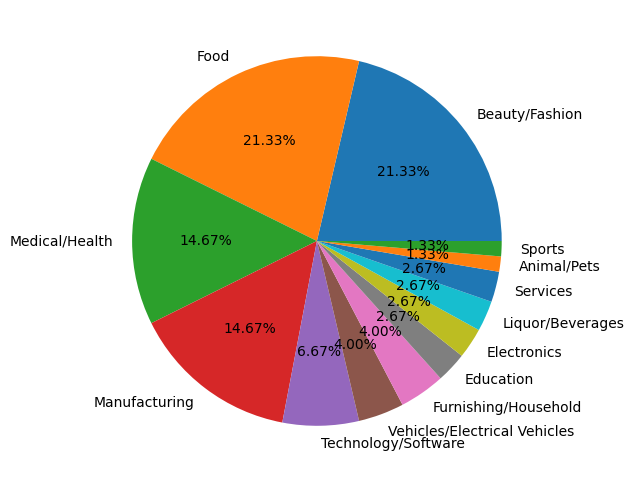

In [56]:
print("Total investments by Anupam", shark_tank[shark_tank['Anupam Investment Amount']>=0][['Anupam Investment Amount']].count().to_string()[-2:])
print("Investment amount by Anupam", round(shark_tank['Anupam Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Anupam", round(shark_tank['Anupam Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Anupam", round(shark_tank['Anupam Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*85)
print(shark_tank.loc[shark_tank['Anupam Investment Amount']>=0][["Startup Name","Industry","Anupam Investment Amount"]].to_string(index=False))
print('-'*85)

print("\nAnupam industry wise investments\n")
print(shark_tank[shark_tank['Anupam Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Anupam Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Anupam Investment Amount']>=0] [["Startup Name","Anupam Investment Amount","Anupam Investment Equity"]].sort_values(by="Anupam Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Anupam Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎇 Vineeta Singh's Investments
#### Vineeta's portfolio has 34% Food industry and 28% Beauty/Fashion industry

Total investments by Vineeta 68
Investment amount by Vineeta 21.25 crores
Equity received by Vineeta 283.05 % in different companies
Debt/loan amount by Vineeta 2.94 crores

Company details:
---------------------------------------------------------------------------
       Startup Name                     Industry  Vineeta Investment Amount
      BluePineFoods                         Food                    25.0000
       BoozScooters Vehicles/Electrical Vehicles                    20.0000
   HeartUpMySleeves               Beauty/Fashion                    12.5000
               NOCD                         Food                    20.0000
              CosIQ               Beauty/Fashion                    25.0000
        JhaJiAchaar                         Food                    28.3000
      SkippiIcePops                         Food                    20.0000
         Get-A-Whey                         Food                    33.3300
     TheQuirkyNaari               Beauty/Fashion 

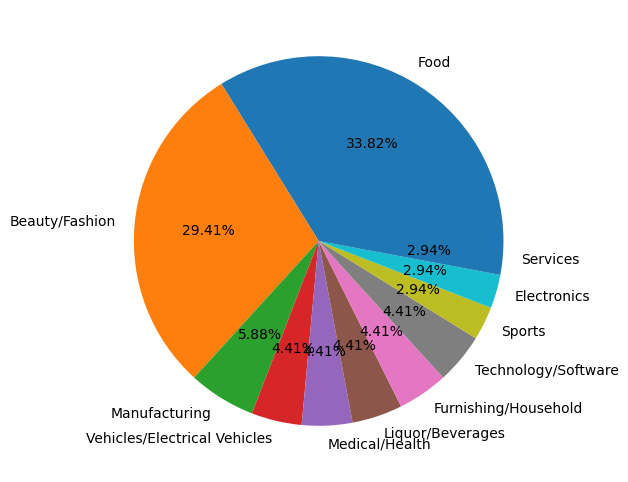

In [57]:
print("Total investments by Vineeta", shark_tank[shark_tank['Vineeta Investment Amount']>0][['Vineeta Investment Amount']].count().to_string()[-2:])
print("Investment amount by Vineeta", round(shark_tank['Vineeta Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Vineeta", round(shark_tank['Vineeta Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Vineeta", round(shark_tank['Vineeta Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Vineeta Investment Amount']>0][["Startup Name","Industry","Vineeta Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nVineeta industry wise investments\n")
print(shark_tank[shark_tank['Vineeta Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Vineeta Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Vineeta Investment Amount']>0] [["Startup Name","Vineeta Investment Amount","Vineeta Investment Equity"]].sort_values(by="Vineeta Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Vineeta Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🚀 Aman Gupta's Investments

Total investments by Aman 109
Investment amount by Aman 36.92 crores
Equity received by Aman 334.57 % in different companies
Debt/loan amount by Aman 6.78 crores

Company details:
---------------------------------------------------------------------------
      Startup Name                     Industry  Aman Investment Amount
     BluePineFoods                         Food               25.000000
         Peeschute               Beauty/Fashion               75.000000
            Bummer               Beauty/Fashion               37.500000
        RevampMoto Vehicles/Electrical Vehicles               50.000000
     SkippiIcePops                         Food               20.000000
 RaisingSuperstars                    Education               50.000000
            Kavach                    Education                2.500000
       BeyondSnack                         Food               25.000000
             Altor                Manufacturing               25.000000
             Ariro      

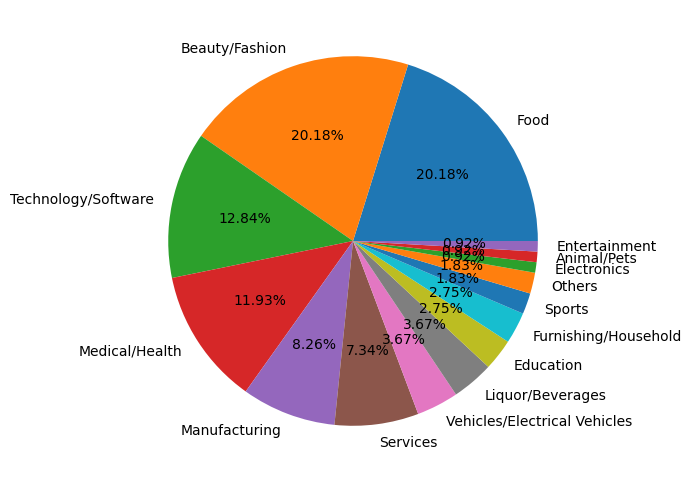

In [58]:
print("Total investments by Aman", shark_tank[shark_tank['Aman Investment Amount']>=0][['Aman Investment Amount']].count().to_string()[-3:])
print("Investment amount by Aman", round(shark_tank['Aman Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Aman", round(shark_tank['Aman Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Aman", round(shark_tank['Aman Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Aman Investment Amount']>=0][["Startup Name","Industry","Aman Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAman industry wise investments\n")
print(shark_tank[shark_tank['Aman Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Aman Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Aman Investment Amount']>=0] [["Startup Name","Aman Investment Amount","Aman Investment Equity"]].sort_values(by="Aman Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Aman Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎾 Peyush Bansal's Investments

Total investments by Peyush  89
Investment amount by Peyush 30.85 crores
Equity received by Peyush 504.43 % in different companies
Debt/loan amount by Peyush 3.67 crores

Company details:
---------------------------------------------------------------------------
      Startup Name                     Industry  Peyush Investment Amount
VivalyfInnovations               Medical/Health                 28.000000
             Ariro                Manufacturing                 25.000000
           Nuutjob               Beauty/Fashion                  8.330000
          Meatyour                         Food                 10.000000
         EventBeep                    Education                 10.000000
              LOKA          Technology/Software                 13.330000
             Annie                    Education                 35.000000
        Carragreen                Manufacturing                 25.000000
     TheYarnBazaar                Manufacturing                 25.000

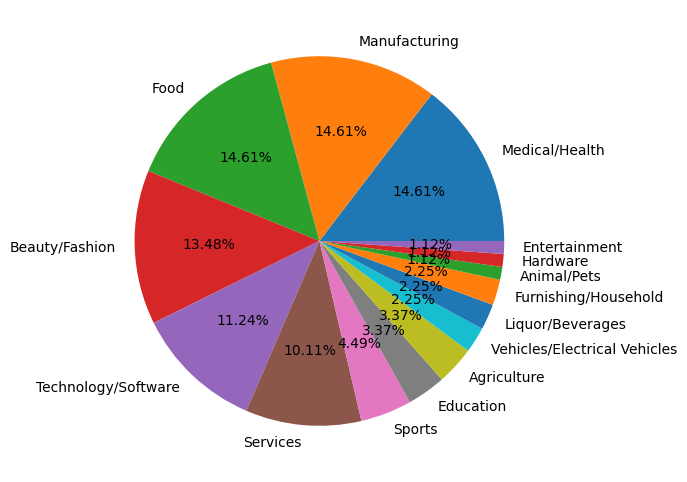

In [59]:
print("Total investments by Peyush", shark_tank[shark_tank['Peyush Investment Amount']>=0][['Peyush Investment Amount']].count().to_string()[-3:])
print("Investment amount by Peyush", round(shark_tank['Peyush Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Peyush", round(shark_tank['Peyush Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Peyush", round(shark_tank['Peyush Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Peyush Investment Amount']>=0][["Startup Name","Industry","Peyush Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nPeyush industry wise investments\n")
print(shark_tank[shark_tank['Peyush Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Peyush Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Peyush Investment Amount']>=0] [["Startup Name","Peyush Investment Amount","Peyush Investment Equity"]].sort_values(by="Peyush Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Peyush Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ✳️ Amit Jain's Investments

Total investments by Amit 35
Investment amount by Amit 12.34 crores
Equity received by Amit 150.05 % in different companies
Debt/loan amount by Amit 2.45 crores

Company details:
---------------------------------------------------------------------------
 Startup Name                     Industry  Amit Investment Amount
    InsideFPV                Manufacturing                   18.75
    Angrakhaa               Beauty/Fashion                   40.00
    MoppFoods                         Food                   75.00
       Dobiee                         Food                   72.00
        Pflow               Medical/Health                   30.00
       ekatra         Furnishing/Household                   10.00
    licksters                         Food                   25.00
   ScrapUncle                     Services                   60.00
       UnStop          Technology/Software                   50.00
  Cakelicious                         Food                   25.00
     Hor

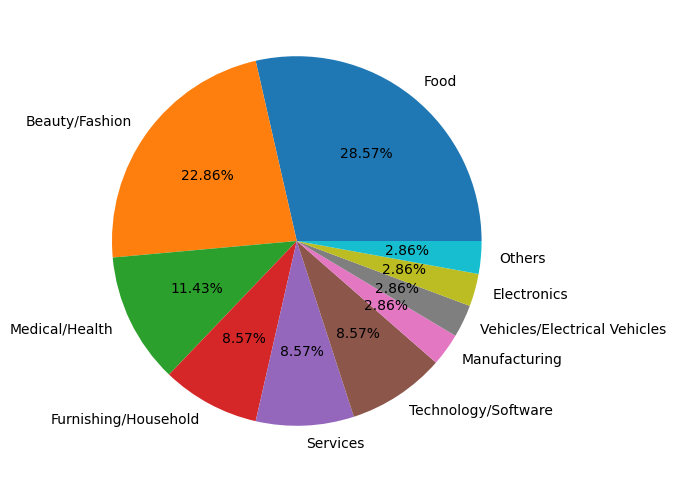

In [60]:
print("Total investments by Amit", shark_tank[shark_tank['Amit Investment Amount']>=0][['Amit Investment Amount']].count().to_string()[-2:])
print("Investment amount by Amit", round(shark_tank['Amit Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Amit", round(shark_tank['Amit Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Amit", round(shark_tank['Amit Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Amit Investment Amount']>0][["Startup Name","Industry","Amit Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAmit industry wise investments\n")
print(shark_tank[shark_tank['Amit Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Amit Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Amit Investment Amount']>0] [["Startup Name","Amit Investment Amount","Amit Investment Equity"]].sort_values(by="Amit Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Amit Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 All Guest's Investments

Total investments by all Guests 48
Investment amount by all Guests 19.08 crores
Equity received by all Guests 157.12 % in different companies
Debt/loan amount by all Guests 3.35 crores

Company details:
---------------------------------------------------------------------------
        Startup Name                     Industry  Guest Investment Amount
          TheSassBar               Beauty/Fashion                25.000000
  SunfoxTechnologies               Medical/Health                20.000000
   WattTechnovations               Medical/Health                 0.000253
             HumpyA2                         Food                33.330000
   GoldSafeSolutions                Manufacturing                16.660000
          WakaoFoods                         Food                25.000000
    NomadFoodProject                         Food                10.000000
             WitBlox                Manufacturing                30.000000
                 TAC               Beauty/Fash

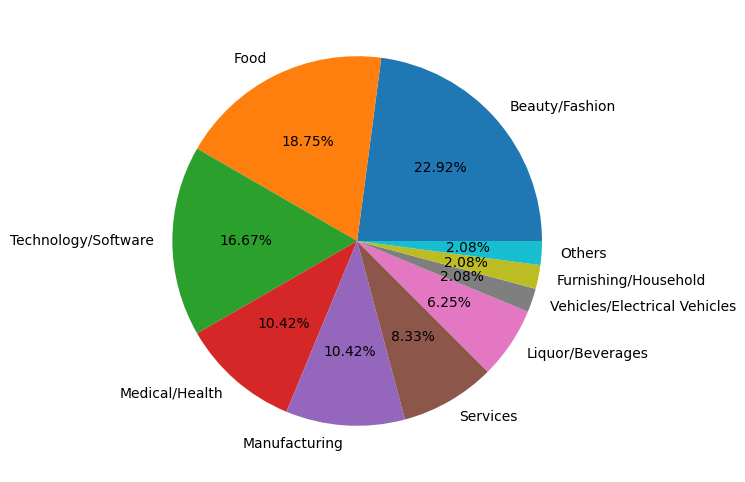

In [61]:
print("Total investments by all Guests", shark_tank[shark_tank['Guest Investment Amount']>=0][['Guest Investment Amount']].count().to_string()[-2:])
print("Investment amount by all Guests", round(shark_tank['Guest Investment Amount'].sum()/100, 2), "crores")
print("Equity received by all Guests", round(shark_tank['Guest Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by all Guests", round(shark_tank['Guest Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Guest Investment Amount']>0][["Startup Name","Industry","Guest Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAll Guests industry wise investments\n")
print(shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount']>0] [["Startup Name","Guest Investment Amount","Guest Investment Equity"]].sort_values(by="Guest Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Guest Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

In [62]:
# Guest sharks and number of companies they invested
shark_tank.loc[shark_tank['Guest Investment Amount'] > 1]['Invested Guest Name'].str.split(',').explode('Guest Name').value_counts().sort_values(ascending=False)

Invested Guest Name
Ritesh Aggarwal     25
Ghazal Alagh         7
Azhar Iqubal         6
Radhika Gupta        6
Vikas D Nahar        2
Ronnie Screwvala     2
Varun Dua            2
Deepinder Goyal      1
Name: count, dtype: int64

In [63]:
# Investment amount by guests, in lakhs
tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount'] > 1][['Invested Guest Name','Guest Investment Amount']]
tmpdf['Number of Guests'] = tmpdf['Invested Guest Name'].str.count(',') + 1
tmpdf['Invetested Amount per Guest'] = tmpdf['Guest Investment Amount'] / tmpdf['Number of Guests']
tmpdf = tmpdf.set_index(tmpdf.columns.drop('Invested Guest Name',1).tolist())['Invested Guest Name'].str.split(',', expand=True).stack().reset_index().rename(columns={0:'Invested Guest Name'}).loc[:, tmpdf.columns]
round(tmpdf.groupby(["Invested Guest Name"])["Invetested Amount per Guest"].sum().sort_values(ascending=False))

Invested Guest Name
Ritesh Aggarwal     863.0
Azhar Iqubal        265.0
Deepinder Goyal     200.0
Radhika Gupta       198.0
Ghazal Alagh        160.0
Varun Dua            90.0
Ronnie Screwvala     68.0
Vikas D Nahar        66.0
Name: Invetested Amount per Guest, dtype: float64

Number of Sharks in Deal
1.0    114
2.0     84
3.0     37
4.0     19
5.0     14
Name: count, dtype: int64 

Number of Sharks in Deal
1.0    43%
2.0    31%
3.0    14%
4.0     7%
5.0     5%
Name: proportion, dtype: object


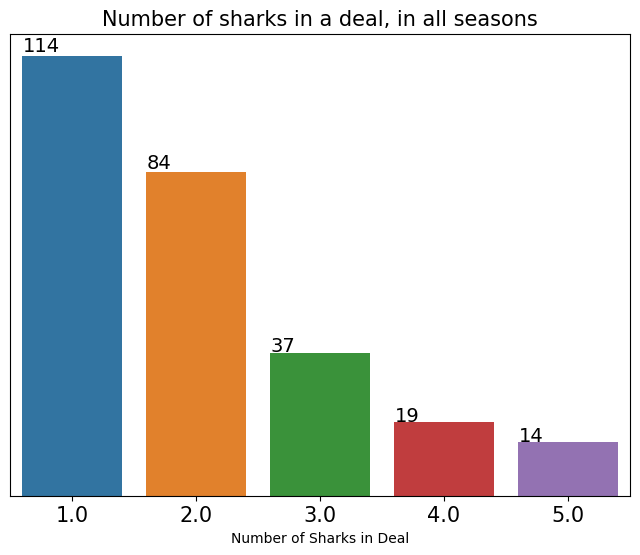

In [64]:
# Number of sharks in a deal, in all seasons
print(shark_tank['Number of Sharks in Deal'].value_counts(), "\n")

# In percentage
print(round(shark_tank['Number of Sharks in Deal'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

fig = plt.figure(figsize=(8, 6))
plt.title("Number of sharks in a deal, in all seasons", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks([])
ax = sns.countplot(data = shark_tank, x = 'Number of Sharks in Deal')
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01), size=14)

In [65]:
# All sharks deals
print(shark_tank.loc[shark_tank['Number of Sharks in Deal'] >= 5][["Startup Name"]].count())
print(shark_tank.loc[shark_tank['Number of Sharks in Deal'] >= 5][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]])

Startup Name    14
dtype: int64
     Season Number        Startup Name  Total Deal Amount  Total Deal Equity
15               1       SkippiIcePops           100.0000               15.0
50               1  FindYourKicksIndia            50.0000               25.0
64               1              INACAN           100.0000               10.0
80               1  SunfoxTechnologies           100.0000                6.0
209              2              Snitch           150.0000                1.5
239              2            Mahantam            30.0000               20.0
274              2         Pharmallama           200.0000                5.0
311              2           Sahayatha           100.0000               10.0
357              3            JewelBox           200.0000                6.0
365              3         NasherMiles           300.0000                1.5
423              3           LittleBox            75.0000                2.5
435              3           Dharaksha      

In [66]:
# Sharks with most number of solo deals
amt_cols = shark_tank.columns[shark_tank.columns.str.contains(' Investment Amount')].tolist()
tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 1][amt_cols]
tmp.count().sort_values(ascending=False).nlargest(3)

# Namita did most number of solo deals, than any other Shark

Namita Investment Amount    25
Aman Investment Amount      22
Peyush Investment Amount    17
dtype: int64

In [67]:
# # Sharks
# tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 2][amt_cols].reset_index(drop=True).stack()
# tmp
# tmp = pd.MultiIndex.from_frame(shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 2][amt_cols])
# tmp
# tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 2][amt_cols].reset_index(drop=True).stack().to_frame().add_suffix('Amount').reset_index()
# tmp.groupby(['level_0','level_1']).count()
# tmp
# tmp2 = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 2][amt_cols]
# tmp2

In [68]:
# Sharks with most number of episode presence, in all seasons
present_cols = shark_tank.columns[shark_tank.columns.str.endswith(' Present')].tolist()
tmp = shark_tank[present_cols]
tmp.sum().sort_values(ascending=False).nlargest(3)

# Anupam was there in most number of episodes, in 3 seasons

Anupam Present    424.0
Aman Present      420.0
Namita Present    389.0
dtype: float64

In [69]:
# Sharks with most number of episode presence, in current/latest season (3rd Season)
tmp = shark_tank.loc[shark_tank['Season Number'] == 3][present_cols]
tmp.sum().sort_values(ascending=False).nlargest(4)

Aman Present       148.0
Anupam Present     142.0
Guest Present      136.0
Vineeta Present    127.0
dtype: float64

In [70]:
# Anchor and number of pitches, they hosted
shark_tank.groupby('Anchor').size()

Anchor
Rahul Dua             319
Rannvijay Singh       152
Snehil Dixit Mehra      7
dtype: int64

In [71]:
# Anchor and number of episodes, they hosted
pd.pivot_table(shark_tank, values='Episode Number', columns='Anchor', aggfunc=lambda x: len(x.unique()))

Anchor,Rahul Dua,Rannvijay Singh,Snehil Dixit Mehra
Episode Number,52,37,2


Pitchers State
Maharashtra          135
Delhi                 71
Karnataka             57
Gujarat               48
Haryana               32
Uttar Pradesh         30
Rajasthan             20
Telangana             20
West Bengal           19
Punjab                15
Tamil Nadu            10
Madhya Pradesh         8
Bihar                  6
Kerala                 5
Jammu & Kashmir        4
Uttarakhand            4
Goa                    4
Jharkhand              4
Himachal Pradesh       2
Chhattisgarh           2
Arunachal Pradesh      2
Assam                  2
Andhra Pradesh         1
Odisha                 1
Name: count, dtype: int64 



<Axes: ylabel='Pitchers State'>

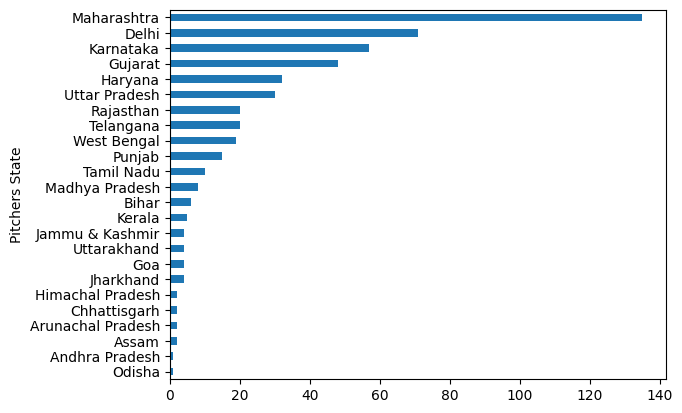

In [72]:
# Indian state-wise startups
print(shark_tank['Pitchers State'].str.split(',').explode('Pitchers State').value_counts(), "\n")
shark_tank['Pitchers State'].str.split(',').explode('Pitchers State').value_counts().sort_values().plot.barh()

In [73]:
# Top 20 Indian Cities
tmp = shark_tank['Pitchers City'].value_counts().nlargest(20).sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b>Indian top 20 cities</b> with number of startups came for pitching", template='simple_white', text=tmp, width=850, height=800)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [74]:
# Most frequently asked amount, by startups
shark_tank.groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (in lakhs) and Number of times asked

Original Ask Amount
50.0     99
100.0    85
75.0     56
60.0     29
80.0     27
150.0    23
40.0     22
30.0     19
200.0    14
90.0     13
dtype: int64

In [75]:
# Most frequently offered equity, by startups
shark_tank.groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number of times offered

Original Offered Equity
1.0     96
2.0     74
5.0     73
10.0    41
3.0     40
2.5     30
4.0     28
0.5     17
1.5     15
7.5     13
dtype: int64

In [76]:
# ✅ Most frequently invested amount, by Sharks
shark_tank.groupby('Total Deal Amount').size().nlargest(10)

# Sharks mostly invested between 50K-1lakh per deal

# Total Deal Amount (in lakhs) and Number of times invested

Total Deal Amount
50.0     52
100.0    43
75.0     26
60.0     20
40.0     17
30.0     14
25.0     13
20.0     10
80.0     10
200.0     8
dtype: int64

In [77]:
# ✅ Most frequently received total equity, by Sharks
shark_tank.groupby('Total Deal Equity').size().nlargest(10)

# Sharks are expecting around 10-20% equity, in a deal

# Total Deal Equity (in %) and Number of times invested

Total Deal Equity
10.0    33
1.0     24
5.0     24
4.0     22
2.0     19
3.0     17
20.0    16
15.0    15
6.0     13
2.5     11
dtype: int64

In [78]:
# Most frequently asked amount (in lakhs), deals received percentage and not received percentage, in sucessful deal ✅
tmp2 = pd.crosstab(shark_tank['Original Ask Amount'], shark_tank['Received Offer']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

,deal_percentage,no_deal_percentage
50.0,69.0,31.0
100.0,69.0,31.0
75.0,70.0,30.0
60.0,66.0,34.0
150.0,78.0,22.0
80.0,63.0,37.0
30.0,84.0,16.0
40.0,73.0,27.0
70.0,90.0,10.0
25.0,64.0,36.0


In [79]:
# Frequently asked amount (in lakhs), deals received percentage and not received percentage, in unsucessful deal ❌
tmp2 = pd.crosstab(shark_tank['Original Ask Amount'], shark_tank['Received Offer']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=True)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(7)

,deal_percentage,no_deal_percentage
30000.0,0.0,100.0
500.0,0.0,100.0
1000.0,0.0,100.0
220.0,0.0,100.0
68.7,0.0,100.0
15.0,0.0,100.0
125.0,0.0,100.0


In [80]:
# Most frequently asked equity, deals received percentage and not received percentage, in sucessful deal ✅
tmp2 = pd.crosstab(shark_tank['Original Offered Equity'], shark_tank['Received Offer']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

,deal_percentage,no_deal_percentage
1.0,70.0,30.0
2.0,76.0,24.0
5.0,55.0,45.0
3.0,68.0,32.0
10.0,63.0,37.0
4.0,86.0,14.0
2.5,57.0,43.0
0.5,94.0,6.0
1.5,73.0,27.0
7.5,62.0,38.0


In [81]:
# Fequently asked equity, deals received percentage and not received percentage, in unsucessful deal ❌
tmp2 = pd.crosstab(shark_tank['Original Offered Equity'], shark_tank['Received Offer']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=True)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(5)

,deal_percentage,no_deal_percentage
2.10,0.0,100.0
3.33,0.0,100.0
1.66,0.0,100.0
1.40,0.0,100.0
30.00,0.0,100.0


In [82]:
# ✅ Mostly successful combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Received Offer'] == 1].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

Original Ask Amount  Original Offered Equity
50.0                 5.0                        16
100.0                1.0                        15
50.0                 2.0                        12
100.0                2.0                        12
50.0                 1.0                         8
60.0                 2.0                         8
75.0                 3.0                         8
100.0                2.5                         8
50.0                 3.0                         7
75.0                 4.0                         7
dtype: int64

In [83]:
# Most frequently asked amount, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (in lakhs) and Number of times asked (but rejected by sharks) ❌

Original Ask Amount
50.0     31
100.0    26
75.0     17
60.0     10
80.0     10
200.0     9
90.0      8
40.0      6
150.0     5
20.0      4
dtype: int64

In [84]:
# Most frequently offered equity, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number of times offered (but rejected by sharks) ❌

Original Offered Equity
5.0     33
1.0     29
2.0     18
10.0    15
2.5     13
3.0     13
7.5      5
1.5      4
4.0      4
15.0     4
dtype: int64

In [85]:
# Mostly rejected combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(5)

# You may not get deal, if you ask for 1 crore with 1% equity or 50K with 5%/10% equity 🔴

Original Ask Amount  Original Offered Equity
100.0                1.0                        10
50.0                 5.0                         9
100.0                2.5                         6
50.0                 10.0                        5
75.0                 5.0                         5
dtype: int64

In [86]:
# shp_gdf = gpd.read_file('../input/india-gis-data/India States/Indian_states.shp')
# shp_gdf['st_nm'] = shp_gdf['st_nm'].str.replace('NCT of Delhi', 'Delhi')
# shp_gdf['st_nm']

In [87]:
# tmpdf = shark_tank[["Season Number","Pitchers State","Total Deal Amount"]]
# tmpdf = tmpdf.set_index(tmpdf.columns.drop('Pitchers State',1).tolist())['Pitchers State'].str.split(',', expand=True).stack().reset_index().rename(columns={0:'Pitchers State'}).loc[:, tmpdf.columns]
# tmpdf.contn.value_counts(dropna=False)
# tmpdf.set_index('Pitchers State')
# tmpdf

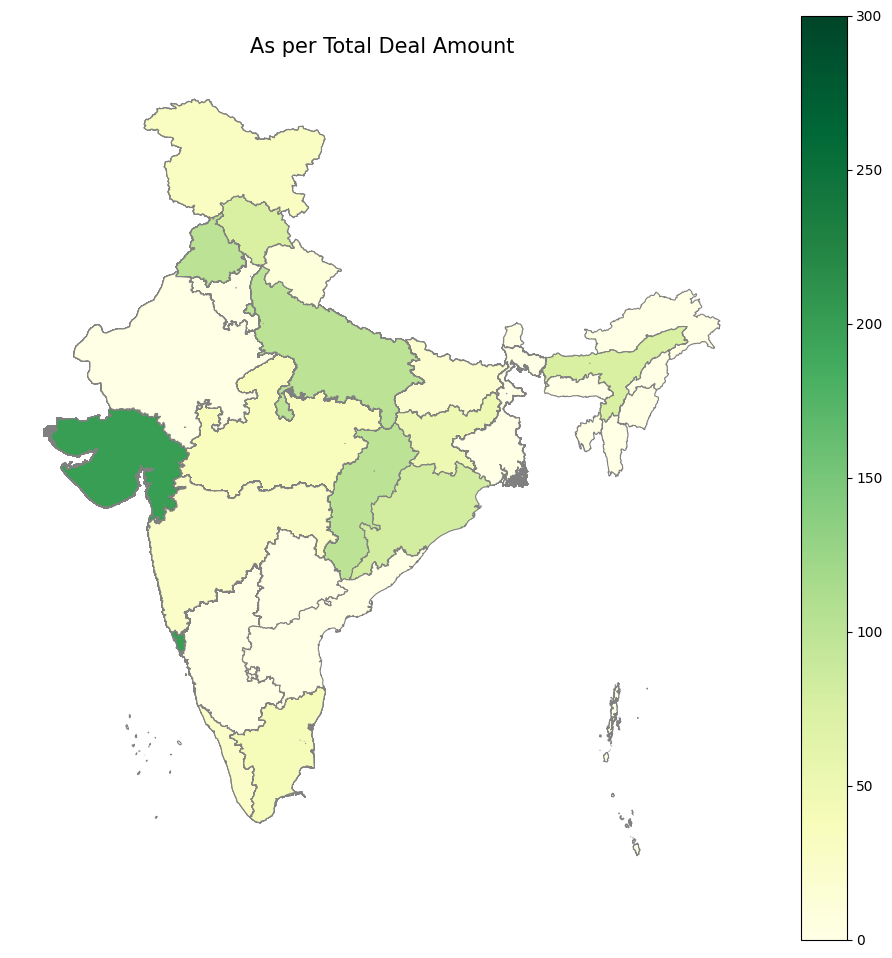

In [88]:
shp_gdf = gpd.read_file('../input/india-gis-data/India States/Indian_states.shp')
shp_gdf['st_nm'] = shp_gdf['st_nm'].str.replace('NCT of Delhi', 'Delhi')
merged = shp_gdf.set_index('st_nm').join(shark_tank.set_index('Pitchers State'))
merged['Total Deal Amount'] = merged['Total Deal Amount'].fillna(0)

fig, ax = plt.subplots(1, figsize=(12, 12))
ax.axis('off')
ax.set_title('As per Total Deal Amount', fontdict={'fontsize': '15', 'fontweight' : '3'})
fig = merged.plot(column='Total Deal Amount', cmap='YlGn', linewidth=0.8, ax=ax, edgecolor='0.5', legend=True)

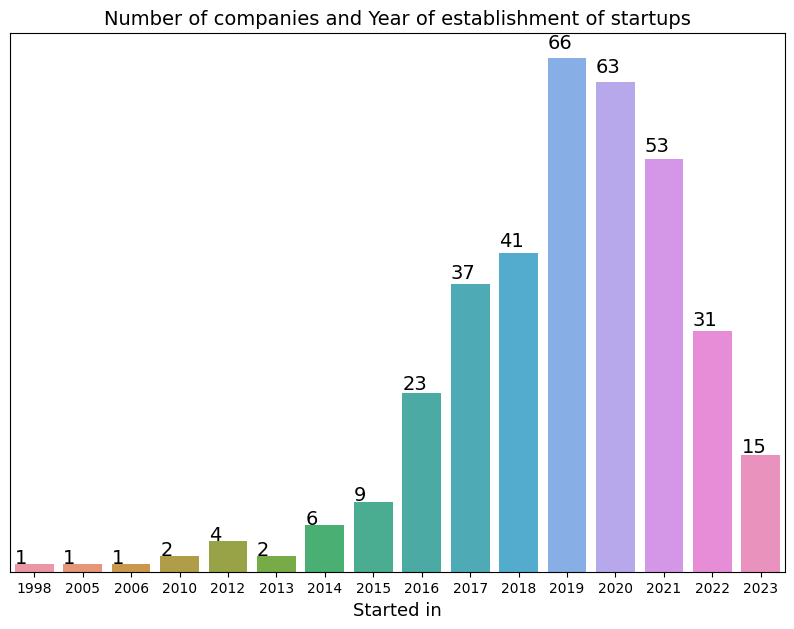

In [89]:
# All seasons, startup companies incorporated year
fig = plt.figure(figsize=(10, 7))
plt.title('Number of companies and Year of establishment of startups', size=14)
tmp = shark_tank.loc[shark_tank['Started in'].notnull()]
ax = sns.countplot(data = tmp, x = 'Started in')
ax.set_xlabel('Started in', fontsize=13)
plt.yticks([])
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.02), size=14)

In [90]:
# Some companies got more amount than they asked/expected
print(shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Season Number","Startup Name","Original Ask Amount","Total Deal Amount"]]

Startup Name    38
dtype: int64


,Season Number,Startup Name,Original Ask Amount,Total Deal Amount
0,1,BluePineFoods,50.0,75.0
10,1,JhaJiAchaar,50.0,56.6
15,1,SkippiIcePops,45.0,100.0
37,1,Annie,30.0,105.0
39,1,TheYarnBazaar,50.0,100.0
43,1,HammerLifestyle,30.0,100.0
59,1,WeSTOCK,50.0,60.0
64,1,INACAN,50.0,100.0
76,1,TheSassBar,40.0,50.0
89,1,HumpyA2,75.0,100.0


In [91]:
# Most of the companies diluted/gave their company equity more than they initially offered/expected
shark_tank.loc[shark_tank['Original Offered Equity'] < shark_tank["Total Deal Equity"]][["Season Number","Startup Name","Original Offered Equity","Total Deal Equity"]]

,Season Number,Startup Name,Original Offered Equity,Total Deal Equity
0,1,BluePineFoods,5.00,16.00
1,1,BoozScooters,15.00,50.00
2,1,HeartUpMySleeves,10.00,30.00
3,1,TagzFoods,1.00,2.75
7,1,Peeschute,4.00,6.00
...,...,...,...,...
463,3,FirstBudOrganics,7.00,10.00
469,3,PTal,1.00,3.20
472,3,Lea,2.00,4.00
475,3,CoolTheGlobe,5.00,8.00


In [92]:
# Below (31) companies got the same valuation they requested (with or without loan)
print(shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    31
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
20,1,Kavach,50.00,50.00
22,1,BeyondSnack,2000.00,2000.00
45,1,Cocofit,0.00,0.00
86,1,WattTechnovations,0.00,0.00
171,2,TheSimplySalad,300.00,300.00
185,2,Janitri,4000.00,4000.00
203,2,NeoMotion,10000.00,10000.00
219,2,PadCare,2500.00,2500.00
223,2,Geeani,1000.00,1000.00
240,2,MindPeers,5300.00,5300.00


In [93]:
# There is 1 company which got more valuation than they pitched, JhaJi Achaar received after the Season (in 2023)
shark_tank.loc[shark_tank['Valuation Requested'] < shark_tank["Deal Valuation"]][["Startup Name","Valuation Requested","Deal Valuation"]]

,Startup Name,Valuation Requested,Deal Valuation
10,JhaJiAchaar,500.0,1007.0
372,HyperLab,1000.0,2500.0


In [94]:
# Some companies were on pre-revenue or didn't had any revenue (as of pitching day)
print(shark_tank.loc[shark_tank['Yearly Revenue'] == 0]['Startup Name'].count())
shark_tank.loc[shark_tank['Yearly Revenue'] == 0]

23


,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
9,1,CosIQ,4,10,20-Dec-21,4-Feb-22,23-Dec-21,Entrepreneurship Ki Wave,Rannvijay Singh,Beauty/Fashion,Intelligent Skincare,https://mycosiq.com/,2021,2,1,1,<NA>,1,Middle,Delhi,Delhi,0,4.0,75,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
23,1,VivalyfInnovations,8,24,20-Dec-21,4-Feb-22,29-Dec-21,Shark Ko Impress Karne Wale Ideas,Rannvijay Singh,Medical/Health,Easy Life Prickless Diabetes Testing Machine,https://vivalyf.in/,2021,2,1,1,<NA>,0,Young,Hyderabad,Telangana,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,28.0,16.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
24,1,MotionBreeze,8,25,20-Dec-21,4-Feb-22,29-Dec-21,Shark Ko Impress Karne Wale Ideas,Rannvijay Singh,Vehicles/Electrical Vehicles,Smart Electric Motorcycle,https://www.motionautomotive.in/,2018,4,4,<NA>,<NA>,0,Middle,Vadodara,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
42,1,GoodGoodPiggy,14,43,20-Dec-21,4-Feb-22,6-Jan-22,Naye Aur Nayab Pitchers,Rannvijay Singh,Technology/Software,Digital Piggy Bank,https://goodgoodpiggy.com/,2021,2,<NA>,2,<NA>,0,Young,Delhi,Delhi,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
77,1,KGAgrotech,24,78,20-Dec-21,4-Feb-22,20-Jan-22,A Decade Of Indian Entrepreneurship,Rannvijay Singh,Agriculture,Agricultural Innovations,https://www.instagram.com/jugaadu_kamlesh/,2022,2,2,<NA>,<NA>,0,Young,Malegaon,Maharashtra,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,10.0,40.00,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal Alagh,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
83,1,JulaaAutomation,26,84,20-Dec-21,4-Feb-22,24-Jan-22,Revolutionary Ideas,Rannvijay Singh,Manufacturing,Automatic Cradle,https://www.automaticjulaa.com/,2022,3,3,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal Alagh,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
98,1,Scholify,30,99,20-Dec-21,4-Feb-22,28-Jan-22,Sharks Ki Expertise,Rannvijay Singh,Education,Scholarship Platform,https://scholifyme.com/,2018,1,1,<NA>,<NA>,0,Middle,Bangalore,Karnataka,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
100,1,Sabjikothi,31,101,20-Dec-21,4-Feb-22,31-Jan-22,Entrepreneurship Ki Raah,Rannvijay Singh,Manufacturing,Vegetables Storage SaptKrishi,https://www.saptkrishi.com/,2019,2,1,1,<NA>,0,Young,Bhagalpur,Bihar,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
114,1,On2Cook,34,115,20-Dec-21,4-Feb-22,3-Feb-22,Scaling Ambitions,Rannvijay Singh,Food,Fastest Cooking Device,https://on2cook.com/,2022,1,1,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal Alagh,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0
131,1,Scintiglo,0,132,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Medical/Health,Diagnostic device for microalbuminuria estimation,https://cemd.in/,2021,1,1,<NA>,<NA>,0,Middl

In [95]:
# Many companies were on burning/paying money from their pocket, without any profit (as of pitching day)
print(shark_tank[shark_tank['Cash Burn'] == 'yes']['Startup Name'].count())
shark_tank.loc[shark_tank['Cash Burn'] == 'yes']

64


,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
62,1,TheStatePlate,20,63,20-Dec-21,4-Feb-22,14-Jan-22,A Variety Of Ideas,Rannvijay Singh,Food,Delicacies,https://thestateplate.com/,2020,2,1,1,<NA>,0,Young,"Bangalore,Kolkata","Karnataka,West Bengal",<NA>,40.0,34,<NA>,...,NaN,NaN,NaN,40.0,3.0,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
81,1,Alpino,25,82,20-Dec-21,4-Feb-22,21-Jan-22,An Ocean Of Opportunities,Rannvijay Singh,Food,Roasted Peanut butter Products,https://alpino.store/,2016,4,4,<NA>,<NA>,0,Young,Surat,Gujarat,<NA>,NaN,38,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal Alagh,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
105,1,GrowFitter,32,106,20-Dec-21,4-Feb-22,1-Feb-22,The Road To Success,Rannvijay Singh,Technology/Software,Rewards App,https://www.growfitter.com/,2021,2,2,<NA>,<NA>,0,Middle,Mumbai,Maharashtra,170,NaN,<NA>,<NA>,...,50.00,2.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
137,1,ZyppElectric,0,138,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Vehicles/Electrical Vehicles,Electrical Vehicles,https://zypp.app/,2017,2,1,1,<NA>,1,Young,Gurgaon,Haryana,<NA>,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
140,1,HappyBar,0,141,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Food,FitSport delicious snacks,https://www.fitsport.me/,2019,3,2,1,<NA>,0,Middle,Hyderabad,Telangana,<NA>,29.0,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,3,Coolant,44,451,22-Jan-24,31-Mar-24,21-Mar-24,Venturing Into Tomorrow,Rahul Dua,Manufacturing,Nature-Based Cooling Technology,https://www.coolant.co/,<NA>,1,1,<NA>,<NA>,0,Middle,Noida,Uttar Pradesh,110,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ritesh Aggarwal,1.0,1.0,1.0,1.0,NaN,NaN,NaN,1.0
453,3,FarmDidi,45,454,22-Jan-24,31-Mar-24,22-Mar-24,From Fields To Roads,Rahul Dua,Food,Food Business training App,https://www.farmdidi.com/,2021,3,1,2,<NA>,0,Middle,"Amravati,Lucknow,Bahadurgarh","Maharashtra,Uttar Pradesh,Haryana",60,10.0,65,<NA>,...,NaN,NaN,NaN,50.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN
462,3,Allter,48,463,22-Jan-24,31-Mar-24,27-Mar-24,Captivating The Sharks,Rahul Dua,Furnishing/Household,Certified Organic Rash-Free Diapers,https://letsallter.com/,2020,1,<NA>,1,<NA>,0,Middle,Delhi,Delhi,1000,NaN,<NA>,<NA>,...,33.33,1.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.33,1.33,NaN,Ritesh Aggarwal,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,NaN,1.0
464,3,Shararat,48,465,22-Jan-24,31-Mar-24,27-Mar-24,Captivating The Sharks,Rahul Dua,Furnishing/Household,Bedroom intimacy Fashion,https://shararat.in/,2020,2,1,1,<NA>,1,Middle,Noida,Uttar Pradesh,330,27.0,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,

In [96]:
# Few companies were having patents/IP, in India/outside (as of pitching day)
print(shark_tank[shark_tank['Has Patents'] == 'yes']['Startup Name'].count())
shark_tank.loc[shark_tank['Has Patents'] == 'yes']

43


,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
6,1,qZenseLabs,3,7,20-Dec-21,4-Feb-22,22-Dec-21,Aam Aadmi Ke Business Ideas,Rannvijay Singh,Food,Food Freshness Detector,https://www.qzense.com/,2020,2,<NA>,2,<NA>,0,Middle,"Delhi,Mohali","Delhi,Punjab",25,15.00,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
15,1,SkippiIcePops,6,16,20-Dec-21,4-Feb-22,27-Dec-21,"New Week, New Ideas",Rannvijay Singh,Food,Ice-Pops,https://skippi.in/,2021,2,1,1,<NA>,1,Middle,Hyderabad,Telangana,<NA>,7.50,<NA>,<NA>,...,20.0,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
19,1,Torch-it,7,20,20-Dec-21,4-Feb-22,28-Dec-21,A Never Give Up Spirit,Rannvijay Singh,Education,Gadgets for visually impaired people,https://mytorchit.com/,2018,1,1,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,260,1.00,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
24,1,MotionBreeze,8,25,20-Dec-21,4-Feb-22,29-Dec-21,Shark Ko Impress Karne Wale Ideas,Rannvijay Singh,Vehicles/Electrical Vehicles,Smart Electric Motorcycle,https://www.motionautomotive.in/,2018,4,4,<NA>,<NA>,0,Middle,Vadodara,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
38,1,Carragreen,13,39,20-Dec-21,4-Feb-22,5-Jan-22,Ideas By Young Entrepreneurs,Rannvijay Singh,Manufacturing,Eco-Friendly boxes,https://carragreen.com/,2018,2,<NA>,2,<NA>,0,Middle,Indore,Madhya Pradesh,<NA>,NaN,<NA>,<NA>,...,NaN,NaN,NaN,25.0,10.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
53,1,RoadBounce,17,54,20-Dec-21,4-Feb-22,11-Jan-22,A Wave Of Startups,Rannvijay Singh,Technology/Software,Pothole Detection Software and Data,https://www.roadbounce.com/,2016,1,1,<NA>,<NA>,0,Middle,Pune,Maharashtra,250,NaN,<NA>,<NA>,...,NaN,NaN,NaN,80.0,20.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
61,1,Magiclock,19,62,20-Dec-21,4-Feb-22,13-Jan-22,Forming An Idea And Bagging A Deal,Rannvijay Singh,Hardware,LPG Cylinder lock,http://www.magiclockdc.com/,2019,3,3,<NA>,<NA>,0,Middle,Mumbai,Maharashtra,<NA>,0.04,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
66,1,Sid07Designs,21,67,20-Dec-21,4-Feb-22,17-Jan-22,Game-changing Ideas,Rannvijay Singh,Hardware,Inventions,https://sid07designs.com/,2018,1,1,<NA>,<NA>,0,Young,Jammu,Jammu & Kashmir,<NA>,1.00,<NA>,<NA>,...,NaN,NaN,NaN,25.0,75.00,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0,NaN
83,1,JulaaAutomation,26,84,20-Dec-21,4-Feb-22,24-Jan-22,Revolutionary Ideas,Rannvijay Singh,Manufacturing,Automatic Cradle,https://www.automaticjulaa.com/,2022,3,3,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal Alagh,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
145,1,Canebot,0,146,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Food,Juice making machine,NaN,2012,2,1,1,<NA>,1,Middle,Pune,Maharashtra,200,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [97]:
# Few companies were bootstrapped (as of pitching day)
print(shark_tank.groupby('Bootstrapped').size(),"\n")
print(shark_tank[shark_tank['Bootstrapped'] == 'yes']['Startup Name'].count(), "bootstrapped companies")
shark_tank.loc[shark_tank['Bootstrapped'] == 'yes']

Bootstrapped
funded    28
yes       20
dtype: int64 

20 bootstrapped companies


,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
385,3,Refit,22,386,22-Jan-24,31-Mar-24,20-Feb-24,Impressive Numbers and High Stakes,Rahul Dua,Electronics,Refurbished Phones,https://refitglobal.com/,2017,2,2,<NA>,<NA>,0,Middle,Delhi,Delhi,18700,3500.00,14,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,66.66,0.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN
386,3,HouseOfBeautyIndia,22,387,22-Jan-24,31-Mar-24,20-Feb-24,Impressive Numbers and High Stakes,Rahul Dua,Beauty/Fashion,Skin care Products,https://houseofbeautyindia.com/,2021,1,<NA>,1,<NA>,0,Middle,Delhi,Delhi,<NA>,40.00,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN
397,3,Cosmix,26,398,22-Jan-24,31-Mar-24,26-Feb-24,Entrepreneurship On The Rise,Rahul Dua,Medical/Health,Herbal Super Supplements,https://cosmix.in/,2019,2,1,1,<NA>,1,Middle,NaN,NaN,750,NaN,70,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azhar Iqubal,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0
401,3,UnclePetersPanCakes,27,402,22-Jan-24,31-Mar-24,27-Feb-24,Entrepreneur's Path To Success,Rahul Dua,Food,Pancake focused QSR,https://www.unclepeterspancakes.com/,<NA>,2,2,<NA>,<NA>,0,Middle,"Kolkata,Varanasi","West Bengal,Uttar Pradesh",1400,210.00,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN
403,3,CandidMen,28,404,22-Jan-24,31-Mar-24,28-Feb-24,Navigating The Tank With New Ideas,Rahul Dua,Beauty/Fashion,Fashion Rental Platform for Men,https://candidmen.in/,2017,2,1,1,<NA>,0,Middle,Bangalore,Karnataka,210,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,30.00,2.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN
414,3,TheShellHair,32,415,22-Jan-24,31-Mar-24,5-Mar-24,Young Entrepreneurs Make Their Mark,Rahul Dua,Beauty/Fashion,Hair Extensions,https://theshellhair.com/,2020,1,<NA>,1,<NA>,0,Young,Ajmer,Rajasthan,120,9.73,<NA>,35,...,30.00,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,NaN,1.0
417,3,BaccaBucci,33,418,22-Jan-24,31-Mar-24,6-Mar-24,Brand Brilliance,Rahul Dua,Beauty/Fashion,Footwear,https://baccabucci.com/,2014,2,2,<NA>,<NA>,0,Young,Delhi,Delhi,4700,NaN,55,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Deepinder Goyal,1.0,1.0,1.0,1.0,NaN,NaN,NaN,1.0
419,3,BeUNatural,33,420,22-Jan-24,31-Mar-24,6-Mar-24,Brand Brilliance,Rahul Dua,Beauty/Fashion,Unisex Salon,NaN,2015,1,1,<NA>,<NA>,0,Middle,Delhi,Delhi,400,28.00,<NA>,25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Deepinder Goyal,1.0,1.0,1.0,1.0,NaN,NaN,NaN,1.0
421,3,Niblerzz,34,422,22-Jan-24,31-Mar-24,7-Mar-24,Visionary Brands Shine Bright,Rahul Dua,Food,Sugar Free Candy,https://niblerzz.com/,2022,2,<NA>,2,<NA>,0,Middle,Mumbai,Maharashtra,16,5.50,<NA>,<NA>,...,10.00,5.00,40.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azhar Iqubal,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0
422,3,Sorich,34,423,22-Jan-24,31-Mar-24,7-Mar-24,Visionary Brands Shine Bright,Rahul Dua,Food,Guilt free Snacks,https://sorichorganics.com/,<NA>,2,1,1,<NA>,1,Middle,Delhi,Delhi,706,55.00,48,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,N

In [98]:
# Few companies were funded
print(shark_tank[shark_tank['Bootstrapped'] == 'funded']['Startup Name'].count(), "funded companies")
shark_tank.loc[shark_tank['Bootstrapped'] == 'funded']

28 funded companies


,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
396,3,Aroleap,26,397,22-Jan-24,31-Mar-24,26-Feb-24,Entrepreneurship On The Rise,Rahul Dua,Medical/Health,Smart Home Gym,https://www.aroleap.com/,2020,3,3,<NA>,<NA>,0,Middle,Bangalore,Karnataka,100,NaN,<NA>,<NA>,...,NaN,NaN,NaN,25.0000,1.25,NaN,25.0,1.25,NaN,NaN,NaN,NaN,25.0000,1.25,NaN,Azhar Iqubal,Azhar Iqubal,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0
398,3,Fabriclore,26,399,22-Jan-24,31-Mar-24,26-Feb-24,Entrepreneurship On The Rise,Rahul Dua,Beauty/Fashion,Custom Fabric Sourcing,https://fabriclore.com/,2016,3,3,<NA>,<NA>,0,Middle,Jaipur,Rajasthan,1000,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azhar Iqubal,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0
404,3,Flyrobe,28,405,22-Jan-24,31-Mar-24,28-Feb-24,Navigating The Tank With New Ideas,Rahul Dua,Beauty/Fashion,Fashion Rental Platform for Men and Women,https://flyrobe.com/home/,2020,1,<NA>,1,<NA>,0,Middle,Delhi,Delhi,290,63.0,<NA>,16,...,50.0000,4.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN
406,3,Cervicheck,29,407,22-Jan-24,31-Mar-24,29-Feb-24,Entrepreneurial Aspirations,Rahul Dua,Medical/Health,Pragmatech Cervical Cancer Screening Test Kits,https://pragmatech.co.in/cervicheck/,2019,2,1,1,<NA>,1,Middle,Vadodara,Gujarat,<NA>,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,NaN,1.0
408,3,AvataarSkincare,30,409,22-Jan-24,31-Mar-24,1-Mar-24,Startups Pursuing Investment,Rahul Dua,Beauty/Fashion,Skincare Services,https://avataarskin.com/,2022,1,<NA>,1,<NA>,0,Middle,Bhopal,Madhya Pradesh,<NA>,60.0,87,<NA>,...,17.5000,0.25,17.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN
411,3,FOMO,31,412,22-Jan-24,31-Mar-24,4-Mar-24,Naye Bharat Ki Neev,Rahul Dua,Liquor/Beverages,Brew Ice Tea,https://fomobrews.com/,<NA>,2,2,<NA>,<NA>,0,Young,Bangalore,Karnataka,<NA>,3.4,50,<NA>,...,17.5000,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,NaN,1.0
415,3,Rize,32,416,22-Jan-24,31-Mar-24,5-Mar-24,Young Entrepreneurs Make Their Mark,Rahul Dua,Food,Energy Bars,https://rizebar.in/,2023,2,2,<NA>,<NA>,0,Young,Gurgaon,Haryana,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,NaN,1.0
418,3,Vobble,33,419,22-Jan-24,31-Mar-24,6-Mar-24,Brand Brilliance,Rahul Dua,Education,Kids Audio Platform,https://www.vobble.fun/,2023,2,<NA>,2,<NA>,0,Middle,Bangalore,Karnataka,<NA>,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Deepinder Goyal,1.0,1.0,1.0,1.0,NaN,NaN,NaN,1.0
429,3,Sama,37,430,22-Jan-24,31-Mar-24,12-Mar-24,Entrepreneurs Seek Sharks Support,Rahul Dua,Services,Online Despite Resolution,https://www.sama.live/,2015,3,2,1,<NA>,0,Middle,Delhi,"Delhi,Bihar,Kerala",640,100.0,<NA>,25,...,33.3300,0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.3300,0.50,NaN,Ritesh Aggarwal,Ritesh Aggarwal,1.0,NaN,1.0,1.0,NaN,1.0,NaN,1.0
430,3,GoldenFeathers,37,431,22-Jan-24,31-Mar-24,12-Mar-24,Entrepreneurs Seek Sharks Support,Rahul Dua,Manufacturing,Fabri

In [99]:
# Top 15 Highest Yearly Revenue brands, in all seasons
print(shark_tank.groupby('Startup Name')['Yearly Revenue'].max().nlargest(15))

tmpdf = shark_tank.sort_values('Yearly Revenue', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Yearly Revenue', color="Startup Name", template='simple_white', title="<b>Highest revenue (in lakhs) of participated startups, in all seasons</b>", text=tmpdf['Yearly Revenue'])
fig.show()

Startup Name
Refit                18700
FrenchCrown           7200
NasherMiles           5700
Rubans                5100
YesMadam              5000
BaccaBucci            4700
Toyshine              4500
LittleBox             3600
Zorko                 3000
UrbanMonkey           2500
GunjanAppsStudios     2400
AdilQadri             2070
UrbanSpace            2050
UnStop                1600
HonestHome            1400
Name: Yearly Revenue, dtype: Int32


In [100]:
# Top 10 Highest Yearly Revenue brands, in latest/current season (3rd season)
print(shark_tank_season3.groupby('Startup Name')['Yearly Revenue'].max().nlargest(10))

tmpdf = shark_tank_season3.sort_values('Yearly Revenue', ascending=False)[0:10]
fig = px.bar(tmpdf, x="Startup Name", y='Yearly Revenue', color="Startup Name", template='simple_white', title="<b>Highest revenue (in lakhs) of participated startups, in Season 3</b>", text=tmpdf['Yearly Revenue'])
fig.show()

Startup Name
Refit                  18700
NasherMiles             5700
YesMadam                5000
BaccaBucci              4700
LittleBox               3600
Zorko                   3000
AdilQadri               2070
UrbanSpace              2050
HonestHome              1400
UnclePetersPanCakes     1400
Name: Yearly Revenue, dtype: Int32


In [101]:
# Top 15 highest Gross Margin brands, in all seasons
print(shark_tank.groupby('Startup Name')['Gross Margin'].max().nlargest(15))

tmpdf = shark_tank.sort_values('Gross Margin', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Gross Margin', color="Startup Name", template='simple_white', title="<b>Highest Gross margin (in %) of the brands (in all seasons)</b>", text=tmpdf['Gross Margin'].map(int).map(str) + "%")
fig.show()

Startup Name
Poo-de-Cologne        150
Farda                 115
Cocofit                95
UnStop                 90
AvataarSkincare        87
EvaScalp               85
MidNightAngelsByPC     83
Auli                   80
KabaddiAdda            80
Lea                    80
LeafyAffair            80
Luvottica              80
OddGiraffe             80
Pflow                  80
Smotect                80
Name: Gross Margin, dtype: Int32


In [102]:
# Top 15 highest Net Margin brands, in all seasons
print(shark_tank.groupby('Startup Name')['Net Margin'].max().nlargest(15))

tmpdf = shark_tank.sort_values('Net Margin', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Net Margin', color="Startup Name", template='simple_white', title="<b>Highest Net margin (in %) of the brands</b>", text=tmpdf['Net Margin'].map(int).map(str) + "%")
fig.show()

Startup Name
TheSassBar            55
KariboCosmetics       50
Chefling              45
AlisteTechnologies    40
Cakelicious           40
TwistingScoops        40
SharmaJiKiAata        38
DrCubes               35
Pabiben               35
TheShellHair          35
VAPerfume             35
NamhyaFoods           34
KabaddiAdda           30
Katidhan              30
Kibo                  30
Name: Net Margin, dtype: Int32


In [103]:
# Top 10 brands with highest EBITDA, in all seasons
print(shark_tank.groupby('Startup Name')['EBITDA'].max().nlargest(10))

tmpdf = shark_tank.sort_values('EBITDA', ascending=False)[0:10]
fig = px.bar(tmpdf, x="Startup Name", y='EBITDA', color="Startup Name", template='simple_white', title="<b>Highest EBITDA (in %) of the brands</b>", text=tmpdf['EBITDA'].map(int).map(str) + "%")
fig.show()

# DATA INCOMPLETE

Startup Name
Deeva                  35.0
CandidMen              33.0
Canvaloop              27.0
Lea                    20.0
UnclePetersPanCakes    20.0
CremeCastle            19.0
Smotect                18.0
FirstBudOrganics       15.0
GulaboJaipur           15.0
LittleBox              15.0
Name: EBITDA, dtype: float64


In [104]:
# Top 10 brands with highest SKUs, in all seasons
print(shark_tank.groupby('Startup Name')['SKUs'].max().nlargest(10))

tmpdf = shark_tank.sort_values('SKUs', ascending=False)[0:10]
fig = px.bar(tmpdf, x="Startup Name", y='SKUs', color="Startup Name", template='simple_white', title="<b>Highest SKUs of the brands</b>", text=tmpdf['SKUs'])
fig.show()

# DATA INCOMPLETE

Startup Name
RarePlanet        6000.0
UrbanSpace        1200.0
TheStatePlate      400.0
GoldenFeathers     386.0
PawsIndia          350.0
PDDFalcon          300.0
ModernMyth         140.0
HungryHead          80.0
NamhyaFoods         70.0
Sorich              67.0
Name: SKUs, dtype: float64


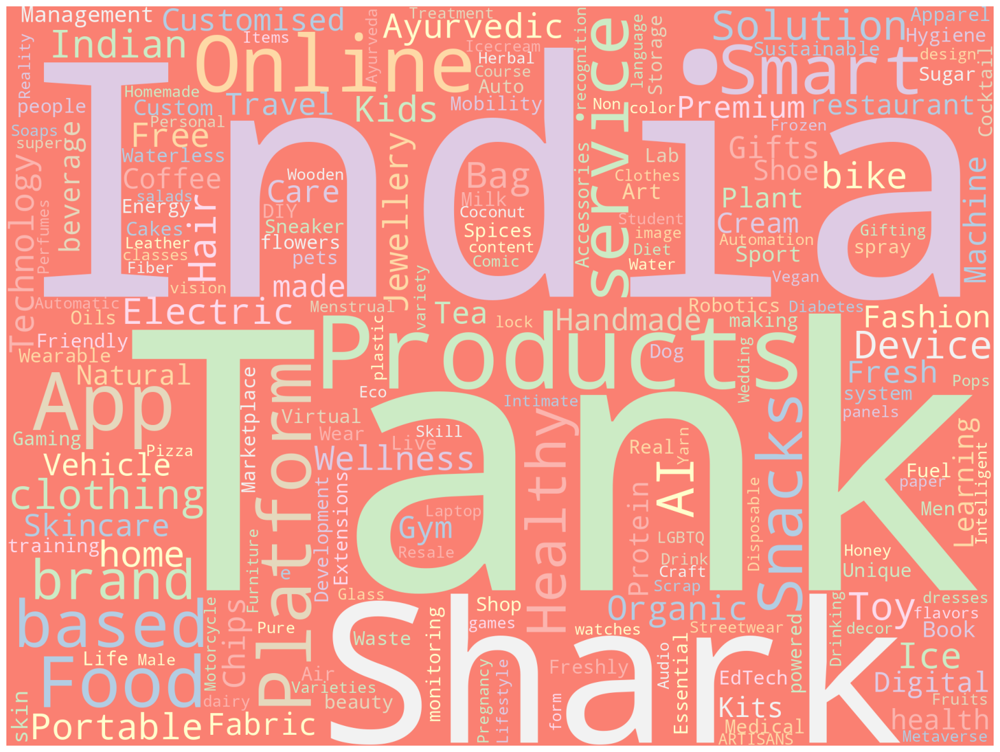

In [105]:
# Word cloud based on Business Description of startups came in all seasons
text = " Shark Tank India ".join(cat for cat in shark_tank.loc[shark_tank['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel1', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(20,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

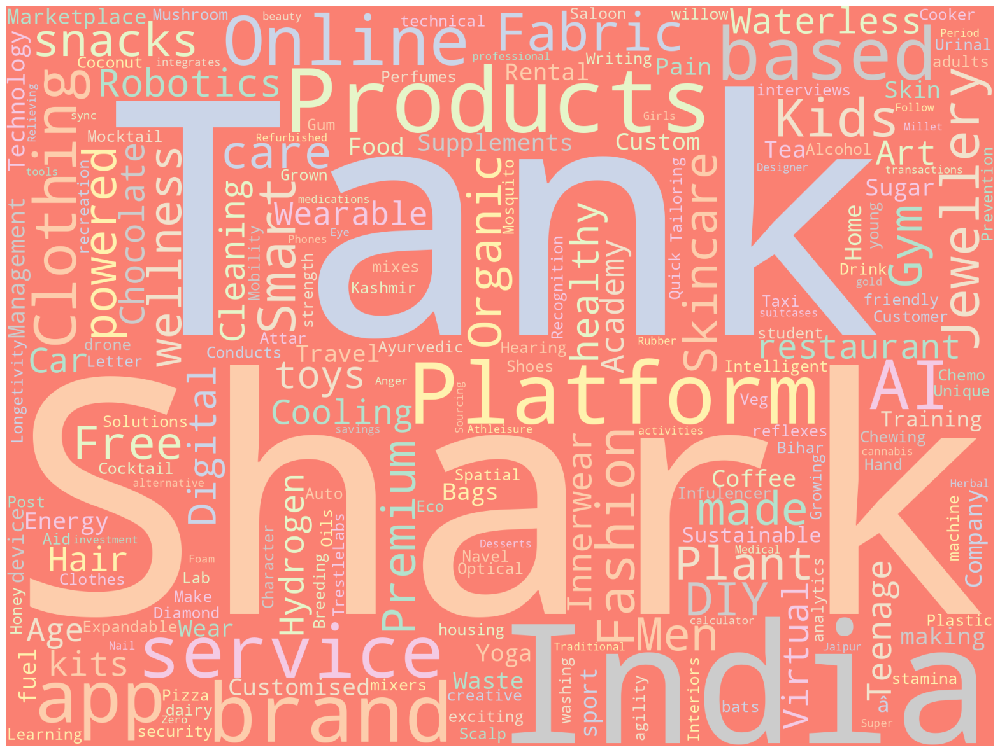

In [106]:
# Word cloud based on Business Description, startups came in current/latest season (3rd season)
text = " Shark Tank India ".join(cat for cat in shark_tank_season3.loc[shark_tank_season3['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(20,16))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [107]:
# Correlation matrix
shark_tank.corr(numeric_only=True).style.background_gradient(cmap = 'Blues')

,Season Number,Episode Number,Pitch Number,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,EBITDA,SKUs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Total Deal Debt,Debt Interest,Deal Valuation,Number of Sharks in Deal,Royalty Deal,Advisory Shares Equity,Namita Investment Amount,Namita Investment Equity,Namita Debt Amount,Vineeta Investment Amount,Vineeta Investment Equity,Vineeta Debt Amount,Anupam Investment Amount,Anupam Investment Equity,Anupam Debt Amount,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
Season Number,1.000000,0.299192,0.942444,0.237105,-0.079620,-0.042201,0.045669,nan,-0.040567,0.124433,0.166217,0.057140,-0.206396,nan,-0.160186,-0.049112,-0.186947,0.060420,0.025722,0.162942,0.139483,-0.435499,0.051634,0.034897,0.266709,-0.059912,nan,nan,0.143268,-0.262202,-0.222166,0.312240,-0.530210,-0.164395,0.204730,-0.398870,0.281408,0.040078,-0.308833,-0.098086,0.187467,-0.268888,0.287528,-0.134372,-0.238125,-0.085391,nan,nan,nan,0.265971,-0.373539,0.311361,nan,nan,nan,nan,nan,nan,nan,0.233300
Episode Number,0.299192,1.000000,0.516715,0.068222,0.013958,0.025950,0.052808,nan,-0.026897,0.005330,-0.001226,0.046201,0.102994,-0.070515,0.072168,-0.032690,-0.048688,0.013480,-0.055909,0.112760,-0.077680,-0.147149,-0.032145,0.191999,-0.024234,0.039102,nan,-0.989457,-0.041336,-0.085128,-0.420926,-0.145495,-0.302051,-0.161503,-0.137436,-0.241801,-0.117643,-0.081552,-0.174042,-0.387537,-0.059377,0.012921,0.126023,-0.202933,-0.295168,0.755349,-0.266455,-0.182477,1.000000,-0.204834,-0.074728,0.186981,nan,nan,nan,nan,nan,nan,nan,-0.038578
Pitch Number,0.942444,0.516715,1.000000,0.231742,-0.071345,-0.047580,0.021275,nan,-0.035097,0.112513,0.146387,0.059736,-0.161700,-0.060761,-0.124115,-0.059855,-0.157866,0.046543,-0.060190,0.134966,0.097460,-0.424409,0.030994,0.118796,0.225000,-0.038069,nan,-0.997631,0.104578,-0.246178,-0.367067,0.227826,-0.574933,-0.205001,0.131589,-0.414795,0.189355,0.007113,-0.315347,-0.225639,0.163035,-0.246439,0.266861,-0.220670,-0.371195,0.246568,-0.261785,-0.163796,1.000000,0.172849,-0.381773,0.499963,nan,nan,nan,nan,nan,nan,nan,0.206870
Started in,0.237105,0.068222,0.231742,1.000000,-0.077705,0.042148,0.075037,nan,-0.170925,-0.124530,-0.065729,0.335169,0.221845,-0.049162,-0.324996,-0.101368,-0.018380,-0.101047,0.064196,0.140016,-0.003913,-0.019558,-0.041374,0.184027,-0.077509,0.127666,nan,0.796448,-0.200620,-0.231898,-0.375435,-0.178772,-0.061057,0.291858,0.081313,-0.004945,0.470617,-0.119720,-0.013891,-0.156444,-0.279102,-0.121466,0.023440,-0.375564,0.084066,-0.544331,0.145770,-0.332778,1.000000,0.236469,0.090979,0.338089,nan,nan,nan,nan,nan,nan,nan,-0.010691
Number of Presenters,-0.079620,0.013958,-0.071345,-0.077705,1.000000,0.749310,0.278756,nan,0.182593,0.023302,-0.004136,-0.190720,0.019759,0.011811,-0.023475,-0.051721,-0.140379,0.072739,-0.003884,-0.062656,0.104675,-0.181173,0.085667,0.071884,0.134131,0.080251,nan,-0.880812,-0.044441,-0.128014,-0.090998,0.157589,-0.193325,-0.170657,0.110768,-0.229264,-0.219613,0.081490,-0.003946,0.197394,0.035070,-0.270648,0.488880,-0.189935,-0.108915,0.711512,-0.078089,-0.278986,nan,-0.029108,-0.199372,-0.948316,nan,nan,nan,nan,nan,nan,nan,-0.041272
Male Presenters,-0.042201,0.025950,-0.047580,0.042148,0.749310,1.000000,0.010403,nan,-0.302148,0.058239,0.028985,-0.111180,0.097952,-0.250575,0.103562,-0.036830,-0.140889,0.075619,-0.005352,0.037429,0.087979,-0.122974,0.184450,0.091828,

In [108]:
print("numpy version: {}". format(np.__version__))
print("pandas version: {}". format(pd.__version__))
import matplotlib
print("matplotlib version: {}". format(matplotlib. __version__))
print("seaborn version: {}". format(sns.__version__))
import plotly
print("plotly version: {}". format(plotly.__version__))

# Current Python package versions
# numpy version: 1.26.4
# pandas version: 2.2.2
# matplotlib version: 3.7.5
# seaborn version: 0.12.2
# plotly version: 5.18.0

numpy version: 1.26.4
pandas version: 2.2.2
matplotlib version: 3.7.5
seaborn version: 0.12.2
plotly version: 5.18.0


## Data set values verification (you can ignore below section)
##### below queries should not return any rows

In [109]:
shark_tank.loc[shark_tank['Number of Presenters'] != shark_tank['Male Presenters'].fillna(0) + shark_tank['Female Presenters'] + shark_tank['Transgender Presenters'].fillna(0)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [110]:
shark_tank.loc[(shark_tank['Male Presenters'].isnull()) & (shark_tank['Couple Presenters'] == 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [111]:
shark_tank.loc[(shark_tank['Female Presenters'].isnull()) & (shark_tank['Couple Presenters'] == 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [112]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Total Deal Amount'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [113]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 1) & (shark_tank['Number of Sharks in Deal'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [114]:
shark_tank.loc[(shark_tank['Accepted Offer'].isnull()) & (shark_tank['Number of Sharks in Deal'] >= 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [115]:
shark_tank.loc[round(shark_tank['Total Deal Amount'].fillna(0),1) != round(shark_tank['Ashneer Investment Amount'].fillna(0) + shark_tank['Namita Investment Amount'].fillna(0) + shark_tank['Anupam Investment Amount'].fillna(0) + shark_tank['Vineeta Investment Amount'].fillna(0) + shark_tank['Aman Investment Amount'].fillna(0) + shark_tank['Peyush Investment Amount'].fillna(0) + shark_tank['Amit Investment Amount'].fillna(0) + shark_tank['Guest Investment Amount'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [116]:
shark_tank.loc[round(shark_tank['Total Deal Equity'].fillna(0),1) != round(shark_tank['Ashneer Investment Equity'].fillna(0) + shark_tank['Namita Investment Equity'].fillna(0) + shark_tank['Anupam Investment Equity'].fillna(0) + shark_tank['Vineeta Investment Equity'].fillna(0) + shark_tank['Aman Investment Equity'].fillna(0) + shark_tank['Peyush Investment Equity'].fillna(0) + shark_tank['Amit Investment Equity'].fillna(0) + shark_tank['Guest Investment Equity'].fillna(0),1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [117]:
shark_tank.loc[round(shark_tank['Total Deal Debt'].fillna(0),1) != round(shark_tank['Ashneer Debt Amount'].fillna(0) + shark_tank['Namita Debt Amount'].fillna(0) + shark_tank['Anupam Debt Amount'].fillna(0) + shark_tank['Vineeta Debt Amount'].fillna(0) + shark_tank['Aman Debt Amount'].fillna(0) + shark_tank['Peyush Debt Amount'].fillna(0) + shark_tank['Amit Debt Amount'].fillna(0) + shark_tank['Guest Debt Amount'].fillna(0),1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [118]:
shark_tank.loc[(shark_tank['Received Offer'] == 1) & (shark_tank['Accepted Offer'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [119]:
shark_tank.loc[(shark_tank['Received Offer'] == 0) & (shark_tank['Accepted Offer'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [120]:
shark_tank.loc[(shark_tank['Number of Sharks in Deal'].fillna(0).round(0).astype(int) != shark_tank['Ashneer Investment Amount'].notnull().astype("int") + shark_tank['Namita Investment Amount'].notnull().astype("int") + shark_tank['Anupam Investment Amount'].notnull().astype("int") + shark_tank['Vineeta Investment Amount'].notnull().astype("int") + shark_tank['Aman Investment Amount'].notnull().astype("int") + shark_tank['Peyush Investment Amount'].notnull().astype("int") + shark_tank['Amit Investment Amount'].notnull().astype("int") + shark_tank['Guest Investment Amount'].notnull().astype("int")) & (shark_tank['Guest Present']<2) ]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [121]:
shark_tank.loc[(shark_tank['Couple Presenters'] != 0) & (shark_tank['Couple Presenters'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [122]:
shark_tank.loc[(shark_tank['Received Offer'] != 0) & (shark_tank['Received Offer'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [123]:
shark_tank.loc[(shark_tank['Accepted Offer'] != 0) & (shark_tank['Accepted Offer'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [124]:
shark_tank.loc[(shark_tank['Ashneer Investment Amount'].notnull()) & (shark_tank['Ashneer Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [125]:
shark_tank.loc[(shark_tank['Namita Investment Amount'].notnull()) & (shark_tank['Namita Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [126]:
shark_tank.loc[(shark_tank['Anupam Investment Amount'].notnull()) & (shark_tank['Anupam Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [127]:
shark_tank.loc[(shark_tank['Vineeta Investment Amount'].notnull()) & (shark_tank['Vineeta Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [128]:
shark_tank.loc[(shark_tank['Aman Investment Amount'].notnull()) & (shark_tank['Aman Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [129]:
shark_tank.loc[(shark_tank['Peyush Investment Amount'].notnull()) & (shark_tank['Peyush Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [130]:
shark_tank.loc[(shark_tank['Amit Investment Amount'].notnull()) & (shark_tank['Amit Present'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [131]:
shark_tank.loc[(shark_tank['Guest Investment Amount'].notnull()) & (shark_tank['Guest Present'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [132]:
shark_tank.loc[(shark_tank['Guest Investment Amount'].notnull()) & (shark_tank['Invested Guest Name'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [133]:
shark_tank.loc[(shark_tank['All Guest Names'].isnull()) & (shark_tank['Guest Present'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [134]:
shark_tank.loc[(shark_tank['Total Deal Debt'].isnull()) & (shark_tank['Debt Interest'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [135]:
shark_tank.loc[(shark_tank['Received Offer'] == 0) & (shark_tank['Deal Has Conditions'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [136]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 0) & (shark_tank['Royalty Deal'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


In [137]:
shark_tank.loc[(shark_tank['Accepted Offer'] == 0) & (shark_tank['Advisory Shares Equity'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present


## Related Articles

### https://www.livemint.com/companies/start-ups/shark-tank-and-india-s-startup-story-in-charts-11681325377779.html